In [1]:
import pandas as pd
import numpy as np
from dotenv import load_dotenv
import os
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit
import plotly.graph_objects as go
import plotly.express as px
from ipywidgets import interact, widgets
from IPython.display import display, clear_output
from prophet import Prophet
import itertools
import tensorflow as tf
import xgboost as xgb
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error, mean_squared_log_error
import ta  # Technical Analysis library
from keras.models import Sequential
from keras.layers import Dense, LSTM
# Load environment variables
_ = load_dotenv()

# Configuration to suppress warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
# Additional configurations for better control over visualizations (optional)
plt.style.use('ggplot')  # For ggplot-like style in plots
pd.options.display.max_columns = None  # Ensure all columns are visible when displaying DataFrames


/Users/aryasmc/Library/Caches/pypoetry/virtualenvs/capstone-project-ItW07abA-py3.12/lib/python3.12/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [2]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV


## Data Loading

In [3]:
# Define the path to the dataset
file_path = '/Users/aryasmc/My_USD/Year_2024/Summer_2024/Capstone_Project/Capstone_Project/Cleaned_Data/cleaned_crypto_updated_722.csv'

# Load the dataset
df = pd.read_csv(file_path)
df.tail()

,time,product_id,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d
10759,2024-07-08,SOL-USD,127.7500,141.9300,131.5900,139.7700,1.308320e+06,8.1800,134.8400,11.099804,0.062001,0,Monday,131.6100,6.612979e+05,134.310,1.798687e+06,146.5200,8.464263e+05,140.39800,138.227326,139.500332,143.330519,53.686794,-3.254681,-3.647992,0.202273,0.233867,0.268956,0.062001,-0.046069,-0.114202
10760,2024-07-08,ADA-USD,0.3309,0.3799,0.3466,0.3687,2.913659e+07,0.0221,0.3554,14.808099,0.063762,0,Monday,0.3466,1.133216e+07,0.350,6.091539e+07,0.4029,1.576925e+07,0.38007,0.369795,0.378660,0.395234,47.821831,-0.014808,-0.013674,0.174966,0.181375,0.202805,0.063762,-0.084885,-0.155907
10761,2024-07-08,AVAX-USD,24.5500,27.2100,25.7500,25.2100,8.732710e+05,-0.5400,25.8800,10.835031,-0.020591,0,Monday,25.7400,3.542851e+05,25.130,1.173774e+06,28.8000,6.265269e+05,26.89200,26.142819,26.730737,28.360464,51.424785,-1.376761,-1.491717,0.164264,0.197318,0.243536,-0.020591,-0.124653,-0.219021
10762,2024-07-08,ETH-USD,2822.6400,3095.9400,2930.7800,3018.4800,1.422160e+05,87.7000,2959.2900,9.682425,0.029924,0,Monday,2930.7800,4.301258e+04,2981.740,2.463550e+05,3438.5900,6.163624e+04,3200.94000,3095.567240,3210.445524,3339.634097,34.155511,-136.218725,-93.316797,0.099514,0.111287,0.135493,0.029924,-0.122175,-0.179948
10763,2024-07-08,UNI-USD,7.3180,8.3090,7.6470,8.0370,4.892049e+05,0.3900,7.8135,13.541951,0.051000,0,Monday,7.6470,2.451391e+05,7.777,1.250569e+06,9.1360,4.390351e+05,8.40440,8.159687,8.576156,9.073046,36.175711,-0.530772,-0.384045,0.161013,0.177700,0.322944,0.051000,-0.120293,-0.200537


The dataset has been successfully loaded from the specified file path. The tail of the DataFrame shows the most recent entries, which include various columns such as time, product_id, low, high, open, close, volume, and various calculated features like price_change, volatility, pct_change, and lag features.

In [4]:
df.columns

Index(['time', 'product_id', 'low', 'high', 'open', 'close', 'volume',
       'price_change', 'average_price', 'volatility', 'pct_change',
       'day_of_week', 'day_name', 'close_lag_1', 'volume_lag_1', 'close_lag_3',
       'volume_lag_3', 'close_lag_7', 'volume_lag_7', 'close_MA10',
       'close_ema_7', 'close_ema_14', 'close_ema_30', 'RSI', 'MACD',
       'Signal_Line', 'volatility_7d', 'volatility_14d', 'volatility_30d',
       'momentum_1d', 'momentum_7d', 'momentum_30d'],
      dtype='object')

In [5]:
df.dtypes

time               object
product_id         object
low               float64
high              float64
open              float64
close             float64
volume            float64
price_change      float64
average_price     float64
volatility        float64
pct_change        float64
day_of_week         int64
day_name           object
close_lag_1       float64
volume_lag_1      float64
close_lag_3       float64
volume_lag_3      float64
close_lag_7       float64
volume_lag_7      float64
close_MA10        float64
close_ema_7       float64
close_ema_14      float64
close_ema_30      float64
RSI               float64
MACD              float64
Signal_Line       float64
volatility_7d     float64
volatility_14d    float64
volatility_30d    float64
momentum_1d       float64
momentum_7d       float64
momentum_30d      float64
dtype: object

##### Handling Zero Values

In [6]:
# Identify columns with zero values
zero_values = (df == 0).sum()

print("Columns with zero values:")
print(zero_values[zero_values > 0])

# Handle zero values (e.g., replace with NaN to be imputed later or another strategy)
df.replace(0, np.nan, inplace=True)

# Check for zero values after replacement
zero_values_after = (df == 0).sum()

print("Columns with zero values after replacement:")
print(zero_values_after[zero_values_after > 0])


Columns with zero values:
price_change      17
pct_change        18
day_of_week     1539
MACD              10
Signal_Line       10
momentum_1d       18
momentum_7d        8
momentum_30d       4
dtype: int64
Columns with zero values after replacement:
Series([], dtype: int64)


#### Feature Engineering and Missing Value Handling

In [7]:
# Ensure 'time' is of datetime type
df['time'] = pd.to_datetime(df['time'])
df['product_id'] = df['product_id'].astype('category')
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

# Function to add lag features
def add_lag_features(group, cols, lags):
    for col in cols:
        for lag in lags:
            group[f'{col}_lag_{lag}'] = group[col].shift(lag)
    return group

# Function to add rolling statistics
def add_rolling_stats(group, cols, windows):
    for col in cols:
        for window in windows:
            group[f'{col}_rolling_mean_{window}'] = group[col].rolling(window=window).mean()
            group[f'{col}_rolling_std_{window}'] = group[col].rolling(window=window).std()
    return group

# Function to add EMA
def add_ema(group, cols, spans):
    for col in cols:
        for span in spans:
            group[f'{col}_ema_{span}'] = group[col].ewm(span=span, adjust=False).mean()
    return group

# Function to add Bollinger Bands
def add_bollinger_bands(group, col, window):
    rolling_mean = group[col].rolling(window).mean()
    rolling_std = group[col].rolling(window).std()
    group[f'{col}_bollinger_upper_band'] = rolling_mean + (rolling_std * 2)
    group[f'{col}_bollinger_lower_band'] = rolling_mean - (rolling_std * 2)
    return group

# Function to add stochastic oscillator
def add_stochastic_oscillator(group, window=14):
    group['stochastic_oscillator'] = ((group['close'] - group['low'].rolling(window).min()) / 
                                      (group['high'].rolling(window).max() - group['low'].rolling(window).min())) * 100
    return group

# Function to add Williams %R
def add_williams_r(group, window=14):
    group['williams_r'] = ((group['high'].rolling(window).max() - group['close']) / 
                           (group['high'].rolling(window).max() - group['low'].rolling(window).min())) * -100
    return group

# Function to add volume oscillator
def add_volume_oscillator(group, short_window=14, long_window=28):
    short_ema = group['volume'].ewm(span=short_window, adjust=False).mean()
    long_ema = group['volume'].ewm(span=long_window, adjust=False).mean()
    group['volume_oscillator'] = short_ema - long_ema
    return group

# Function to add percentage lag features
def add_pct_lag_features(group, col, lags):
    for lag in lags:
        group[f'{col}_pct_lag_{lag}'] = group[col].pct_change(lag)
    return group

# Function to add all features to a group
def add_all_features(group):
    group = add_lag_features(group, ['close', 'volume'], [14, 30])
    group = add_rolling_stats(group, ['close', 'volume'], [14, 30])
    group = add_ema(group, ['close'], [50, 100])
    group = add_bollinger_bands(group, 'close', 20)
    group = add_stochastic_oscillator(group)
    group = add_williams_r(group)
    group = add_volume_oscillator(group)
    group['month'] = group['time'].dt.month
    group['quarter'] = group['time'].dt.quarter
    group['high_low_ratio'] = group['high'] / group['low']
    group['close_open_ratio'] = group['close'] / group['open']
    group['log_return_lag_1'] = np.log(group['close'] / group['close'].shift(1))
    group['log_return_lag_7'] = np.log(group['close'] / group['close'].shift(7))
    group = add_pct_lag_features(group, 'close', [1, 3, 7, 14, 30])
    return group

# Function to handle missing values in numerical columns
def impute_numerical(group):
    group = group.ffill().bfill().interpolate(method='linear')
    return group

# Function to handle missing values in categorical columns
def impute_categorical(group):
    return group.ffill()

# Process each product_id group separately
df_list = []
for product_id, group in df.groupby('product_id'):
    group = add_all_features(group)
    group[numerical_cols] = impute_numerical(group[numerical_cols])
    group[categorical_cols] = impute_categorical(group[categorical_cols])
    df_list.append(group)

# Combine all groups back into a single DataFrame
df = pd.concat(df_list)

# Validate after imputation and feature engineering
print("Null values after imputation and feature engineering:")
print(df.isnull().sum())

# Display a sample of the updated DataFrame
df.head()


Null values after imputation and feature engineering:
time                  0
product_id            0
low                   0
high                  0
open                  0
                   ... 
close_pct_lag_1      10
close_pct_lag_3      30
close_pct_lag_7      70
close_pct_lag_14    140
close_pct_lag_30    300
Length: 62, dtype: int64


,time,product_id,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d,close_lag_14,close_lag_30,volume_lag_14,volume_lag_30,close_rolling_mean_14,close_rolling_std_14,close_rolling_mean_30,close_rolling_std_30,volume_rolling_mean_14,volume_rolling_std_14,volume_rolling_mean_30,volume_rolling_std_30,close_ema_50,close_ema_100,close_bollinger_upper_band,close_bollinger_lower_band,stochastic_oscillator,williams_r,volume_oscillator,month,quarter,high_low_ratio,close_open_ratio,log_return_lag_1,log_return_lag_7,close_pct_lag_1,close_pct_lag_3,close_pct_lag_7,close_pct_lag_14,close_pct_lag_30
0,2021-07-16,ADA-USD,1.1661,1.2452,1.2249,1.1714,36764908.57,-0.0535,1.20565,6.783295,0.001366,4.0,Friday,1.1714,36764908.57,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.171400,1.171400,1.171400,65.086888,0.000128,0.000026,0.145345,0.143173,0.260852,0.001366,0.031159,0.851289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.171400,1.171400,NaN,NaN,NaN,NaN,0.000000e+00,7,3,1.067833,0.956323,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,2021-07-17,ADA-USD,1.1503,1.1954,1.1714,1.1730,30485996.64,0.0016,1.17285,3.920716,0.001366,5.0,Saturday,1.1714,36764908.57,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.171800,1.171613,1.171503,65.086888,0.000128,0.000026,0.145345,0.143173,0.260852,0.001366,0.031159,0.851289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.171463,1.171432,NaN,NaN,NaN,NaN,-4.041598e+05,7,3,1.039207,1.001366,0.001365,NaN,0.001366,NaN,NaN,NaN,NaN
19,2021-07-18,ADA-USD,1.1674,1.2193,1.1731,1.1815,20204036.80,0.0084,1.19335,4.445777,0.007246,6.0,Sunday,1.1730,30485996.64,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.174225,1.172932,1.172148,65.086888,0.000904,0.000201,0.145345,0.143173,0.260852,0.007246,0.031159,0.851289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.171856,1.171631,NaN,NaN,NaN,NaN,-1.388386e+06,7,3,1.044458,1.007161,0.007220,NaN,0.007246,NaN,NaN,NaN,NaN
34,2021-07-19,ADA-USD,1.1159,1.1922,1.1816,1.1226,38666530.06,-0.0590,1.15405,6.837530,-0.049852,6.0,Monday,1.1815,20204036.80,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.161319,1.166221,1.168952,65.086888,-0.003196,-0.000478,0.145345,0.143173,0.260852,-0.049852,0.031159,0.851289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.169925,1.170660,NaN,NaN,NaN,NaN,-9.813974e+05,7,3,1.068375,0.950068,-0.051137,NaN,-0.049852,-0.041660,NaN,NaN,NaN
37,2021-07-20,ADA-USD,1.0250,1.1365,1.1228,1.0559,98783713.28,-0.0669,1.08075,10.878049,-0.059416,1.0,Tuesday,1.1226,38666530.06,1.1730,30485996.64,1.1714,36764908.57,1.17324,1.134964,1.151511,1.161658,65.086888,-0.011693,-0.002721,0.145345,0.143173,0.260852,-0.059416,0.031159,0.851289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.165453,1.168388,NaN,NaN,NaN,NaN,3.225636e+06,7,3,1.108780,0.940417,-0.061254,NaN,-0.059416,-0.099829,NaN,NaN,NaN


In [8]:
df.tail()

,time,product_id,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d,close_lag_14,close_lag_30,volume_lag_14,volume_lag_30,close_rolling_mean_14,close_rolling_std_14,close_rolling_mean_30,close_rolling_std_30,volume_rolling_mean_14,volume_rolling_std_14,volume_rolling_mean_30,volume_rolling_std_30,close_ema_50,close_ema_100,close_bollinger_upper_band,close_bollinger_lower_band,stochastic_oscillator,williams_r,volume_oscillator,month,quarter,high_low_ratio,close_open_ratio,log_return_lag_1,log_return_lag_7,close_pct_lag_1,close_pct_lag_3,close_pct_lag_7,close_pct_lag_14,close_pct_lag_30
10717,2024-07-04,UNI-USD,7.591,8.576,8.517,7.628,6.506769e+05,-0.889,8.0835,12.975893,-0.104169,3.0,Thursday,8.515,7.175301e+05,9.136,4.390351e+05,9.494,596266.115177,8.9763,8.673641,9.085033,9.427039,19.349885,-0.398363,-0.205223,0.125250,0.139463,0.316177,-0.104169,-0.196545,-0.334845,10.023,11.468,6.845749e+05,3.647640e+06,9.177714,0.586787,9.7929,0.880008,527014.308607,317709.902195,819007.263121,503303.384497,9.462513,9.336345,11.541557,7.690243,1.357300,-98.642700,-114305.669746,7,3,1.129759,0.895621,-0.110004,-0.218834,-0.104169,-0.165061,-0.196545,-0.238950,-0.334845
10724,2024-07-05,UNI-USD,6.770,7.825,7.629,7.777,1.250569e+06,0.148,7.2975,15.583456,0.019533,4.0,Friday,7.628,6.506769e+05,8.987,7.860285e+05,8.988,435616.371548,8.8037,8.449480,8.910629,9.320585,23.586135,-0.465716,-0.257322,0.130373,0.144490,0.317322,0.019533,-0.134735,-0.303386,9.804,11.164,5.441185e+05,1.295237e+06,9.032929,0.665203,9.6800,0.914624,577475.066287,372084.103912,817518.335538,501910.110970,9.396414,9.305467,11.303771,7.554329,30.340464,-69.659536,-66952.603603,7,3,1.155835,1.019400,0.019345,-0.144720,0.019533,-0.134639,-0.134735,-0.206752,-0.303386
10740,2024-07-06,UNI-USD,7.667,8.265,7.777,8.192,4.758341e+05,0.415,7.9660,7.799661,0.053362,5.0,Saturday,7.777,1.250569e+06,8.515,7.175301e+05,8.844,239536.755024,8.6842,8.385110,8.814812,9.247773,30.554240,-0.480073,-0.301872,0.149518,0.159497,0.320896,0.053362,-0.073722,-0.228335,9.834,10.616,2.870612e+05,6.560012e+05,8.915643,0.657811,9.5992,0.935907,590958.845158,364084.821504,811512.766989,504977.887395,9.349183,9.283418,10.763119,7.716581,42.844230,-57.155770,-77995.922781,7,3,1.077997,1.053362,0.051987,-0.076581,0.053362,-0.037933,-0.073722,-0.166972,-0.228335
10752,2024-07-07,UNI-USD,7.596,8.203,8.192,7.647,2.451391e+05,-0.545,7.8995,7.991048,-0.066528,6.0,Sunday,8.192,4.758341e+05,7.628,6.506769e+05,9.281,211298.663539,8.4995,8.200583,8.659103,9.144498,27.452649,-0.529327,-0.347363,0.140953,0.168307,0.319127,-0.066528,-0.176059,-0.221204,9.766,9.819,2.049080e+05,8.475779e+05,8.764286,0.690090,9.5268,1.000125,593832.495196,360948.672411,791431.471809,515365.890655,9.282430,9.251014,10.631444,7.552456,28.839198,-71.160802,-101038.869712,7,3,1.079910,0.933472,-0.068845,-0.193656,-0.066528,0.002491,-0.176059,-0.216977,-0.221204
10763,2024-07-08,UNI-USD,7.318,8.309,7.647,8.037,4.892049e+05,0.390,7.8135,13.541951,0.051000,6.0,Monday,7.647,2.451391e+05,7.777,1.250569e+06,9.136,439035.088161,8.4044,8.159687,8.576156,9.073046,36.175711,-0.530772,-0.384045,0.161013,0.177700,0.322944,0.051000,-0.120293,-0.200537,9.321,10.053,1.423526e+06,5.074900e+05,8.672571,0.695710,9.4596,1.030808,527095.261022,270880.707551,790821.966795,515723.965952,9.233590,9.226974,10.579874,7.431426,43.977785,-56.022215,-102993.069867,7,3,1.135420,1.051000,0.049742,-0.128167,0.051000,0.033432,-0.120293,-0.137753,-0.200537


The dataset has been successfully updated with various feature engineering techniques applied. The updated DataFrame includes lag features, rolling statistics, EMA, Bollinger Bands, stochastic oscillator, Williams %R, volume oscillator, and percentage lag features. Additionally, the data types for the time and product_id columns have been corrected, and missing values have been imputed.

The resulting DataFrame has 62 columns with the newly engineered features, and the imputation process left some null values in the percentage lag features.

### Imputation of Remaining Null Values


In [9]:
# Function to impute remaining null values
def impute_remaining_nulls(df):
    # Identify columns with null values
    cols_with_nulls = df.columns[df.isnull().any()]
    # Apply imputation methods to these columns
    df[cols_with_nulls] = df[cols_with_nulls].ffill().bfill().interpolate(method='linear')
    return df

# Apply feature recalculation and final imputation
df = impute_remaining_nulls(df)

# Validate after final imputation
print("Null values after final imputation:")
print(df.isnull().sum())

# Display a sample of the updated DataFrame
df.head()


Null values after final imputation:
time                0
product_id          0
low                 0
high                0
open                0
                   ..
close_pct_lag_1     0
close_pct_lag_3     0
close_pct_lag_7     0
close_pct_lag_14    0
close_pct_lag_30    0
Length: 62, dtype: int64


,time,product_id,low,high,open,close,volume,price_change,average_price,volatility,pct_change,day_of_week,day_name,close_lag_1,volume_lag_1,close_lag_3,volume_lag_3,close_lag_7,volume_lag_7,close_MA10,close_ema_7,close_ema_14,close_ema_30,RSI,MACD,Signal_Line,volatility_7d,volatility_14d,volatility_30d,momentum_1d,momentum_7d,momentum_30d,close_lag_14,close_lag_30,volume_lag_14,volume_lag_30,close_rolling_mean_14,close_rolling_std_14,close_rolling_mean_30,close_rolling_std_30,volume_rolling_mean_14,volume_rolling_std_14,volume_rolling_mean_30,volume_rolling_std_30,close_ema_50,close_ema_100,close_bollinger_upper_band,close_bollinger_lower_band,stochastic_oscillator,williams_r,volume_oscillator,month,quarter,high_low_ratio,close_open_ratio,log_return_lag_1,log_return_lag_7,close_pct_lag_1,close_pct_lag_3,close_pct_lag_7,close_pct_lag_14,close_pct_lag_30
0,2021-07-16,ADA-USD,1.1661,1.2452,1.2249,1.1714,36764908.57,-0.0535,1.20565,6.783295,0.001366,4.0,Friday,1.1714,36764908.57,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.171400,1.171400,1.171400,65.086888,0.000128,0.000026,0.145345,0.143173,0.260852,0.001366,0.031159,0.851289,1.1714,1.1714,36764908.57,36764908.57,1.203036,0.065893,1.388273,0.277553,4.745475e+07,2.793658e+07,6.612506e+07,4.734604e+07,1.171400,1.171400,1.409259,1.075041,69.6,-30.4,0.000000e+00,7,3,1.067833,0.956323,0.001365,0.030684,0.001366,-0.041660,0.031159,0.1196,0.851289
12,2021-07-17,ADA-USD,1.1503,1.1954,1.1714,1.1730,30485996.64,0.0016,1.17285,3.920716,0.001366,5.0,Saturday,1.1714,36764908.57,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.171800,1.171613,1.171503,65.086888,0.000128,0.000026,0.145345,0.143173,0.260852,0.001366,0.031159,0.851289,1.1714,1.1714,36764908.57,36764908.57,1.203036,0.065893,1.388273,0.277553,4.745475e+07,2.793658e+07,6.612506e+07,4.734604e+07,1.171463,1.171432,1.409259,1.075041,69.6,-30.4,-4.041598e+05,7,3,1.039207,1.001366,0.001365,0.030684,0.001366,-0.041660,0.031159,0.1196,0.851289
19,2021-07-18,ADA-USD,1.1674,1.2193,1.1731,1.1815,20204036.80,0.0084,1.19335,4.445777,0.007246,6.0,Sunday,1.1730,30485996.64,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.174225,1.172932,1.172148,65.086888,0.000904,0.000201,0.145345,0.143173,0.260852,0.007246,0.031159,0.851289,1.1714,1.1714,36764908.57,36764908.57,1.203036,0.065893,1.388273,0.277553,4.745475e+07,2.793658e+07,6.612506e+07,4.734604e+07,1.171856,1.171631,1.409259,1.075041,69.6,-30.4,-1.388386e+06,7,3,1.044458,1.007161,0.007220,0.030684,0.007246,-0.041660,0.031159,0.1196,0.851289
34,2021-07-19,ADA-USD,1.1159,1.1922,1.1816,1.1226,38666530.06,-0.0590,1.15405,6.837530,-0.049852,6.0,Monday,1.1815,20204036.80,1.1714,36764908.57,1.1714,36764908.57,1.17324,1.161319,1.166221,1.168952,65.086888,-0.003196,-0.000478,0.145345,0.143173,0.260852,-0.049852,0.031159,0.851289,1.1714,1.1714,36764908.57,36764908.57,1.203036,0.065893,1.388273,0.277553,4.745475e+07,2.793658e+07,6.612506e+07,4.734604e+07,1.169925,1.170660,1.409259,1.075041,69.6,-30.4,-9.813974e+05,7,3,1.068375,0.950068,-0.051137,0.030684,-0.049852,-0.041660,0.031159,0.1196,0.851289
37,2021-07-20,ADA-USD,1.0250,1.1365,1.1228,1.0559,98783713.28,-0.0669,1.08075,10.878049,-0.059416,1.0,Tuesday,1.1226,38666530.06,1.1730,30485996.64,1.1714,36764908.57,1.17324,1.134964,1.151511,1.161658,65.086888,-0.011693,-0.002721,0.145345,0.143173,0.260852,-0.059416,0.031159,0.851289,1.1714,1.1714,36764908.57,36764908.57,1.203036,0.065893,1.388273,0.277553,4.745475e+07,2.793658e+07,6.612506e+07,4.734604e+07,1.165453,1.168388,1.409259,1.075041,69.6,-30.4,3.225636e+06,7,3,1.108780,0.940417,-0.061254,0.030684,-0.059416,-0.099829,0.031159,0.1196,0.851289


All null values have been successfully imputed, and the DataFrame is now complete with no missing values. This ensures that the dataset is ready for further analysis without any gaps that could affect model performance.


In [10]:
# Check for zero values in numerical columns
zero_values = (df[numerical_cols] == 0).sum()
zero_values = zero_values[zero_values > 0]

# Display columns with zero values
print("Columns with zero values:")
print(zero_values)


Columns with zero values:
Series([], dtype: int64)


In [11]:
df.isnull().sum()

time                0
product_id          0
low                 0
high                0
open                0
                   ..
close_pct_lag_1     0
close_pct_lag_3     0
close_pct_lag_7     0
close_pct_lag_14    0
close_pct_lag_30    0
Length: 62, dtype: int64

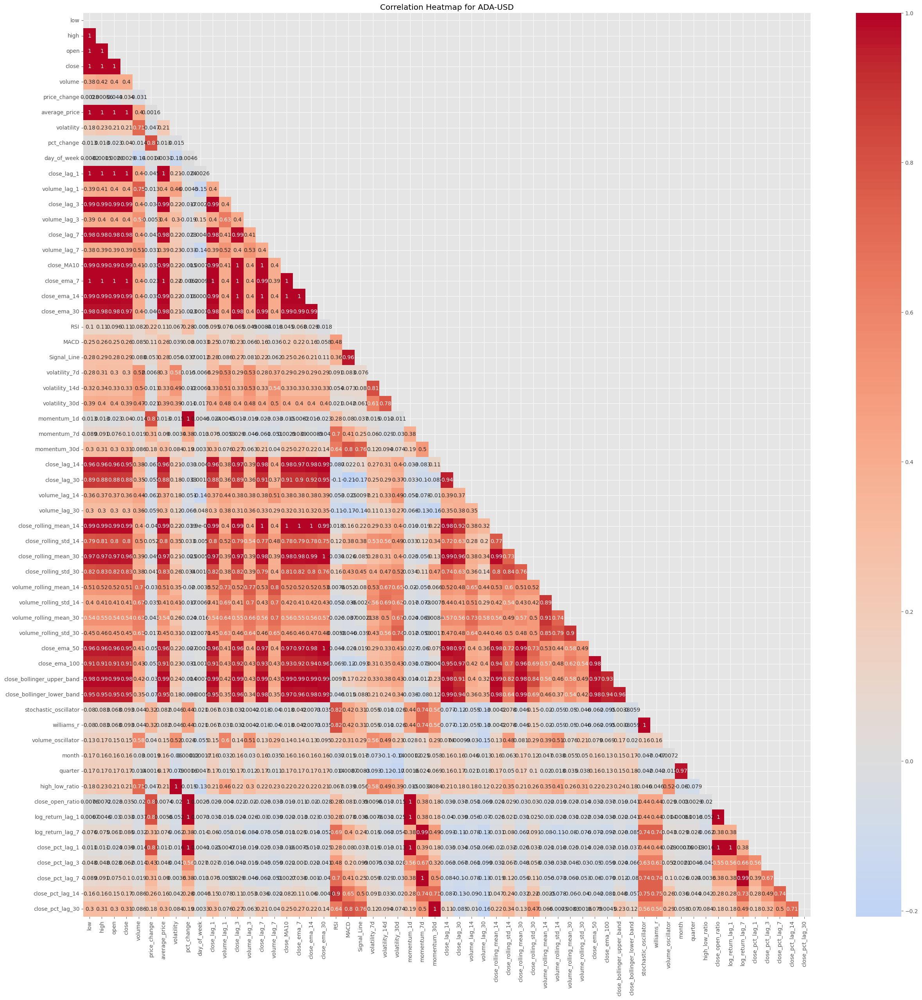

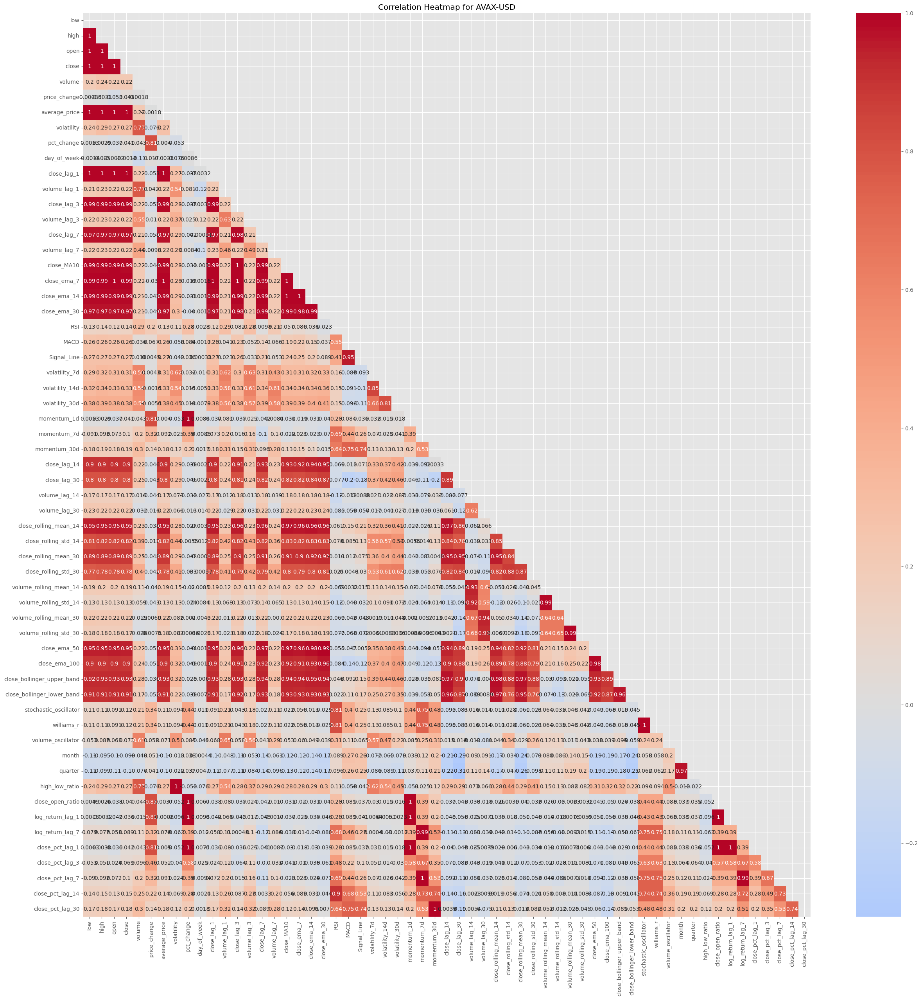

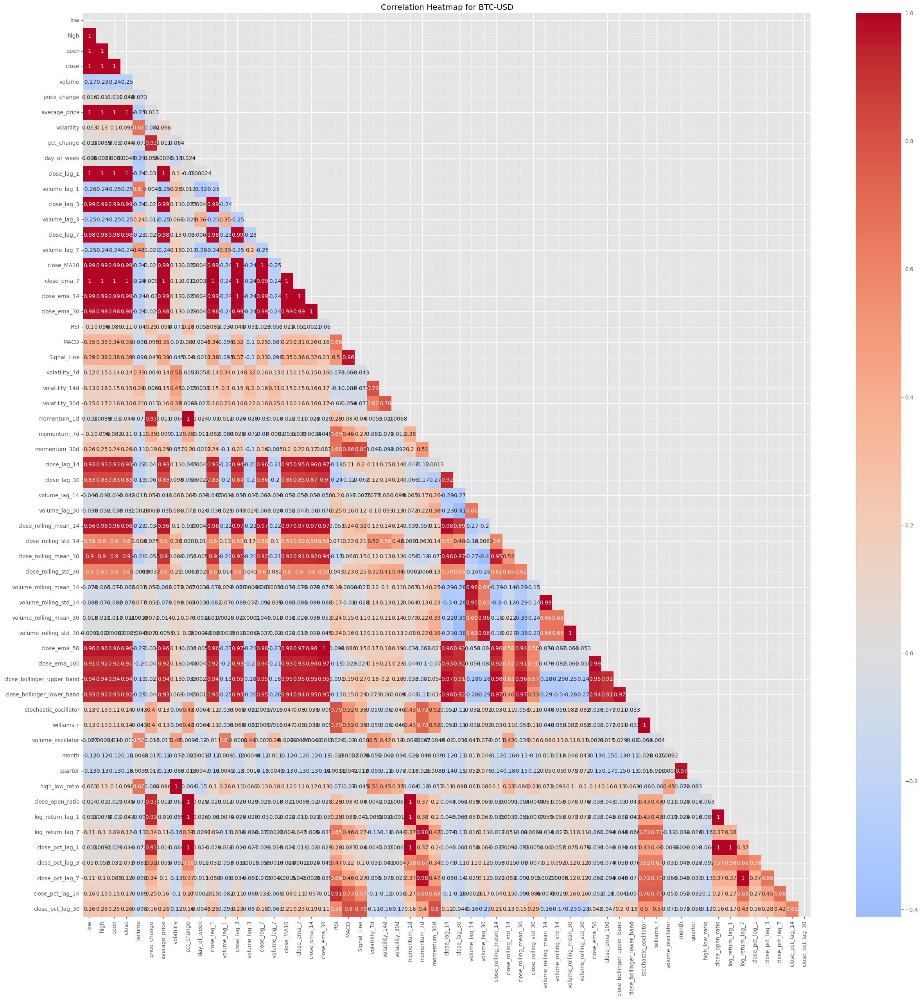

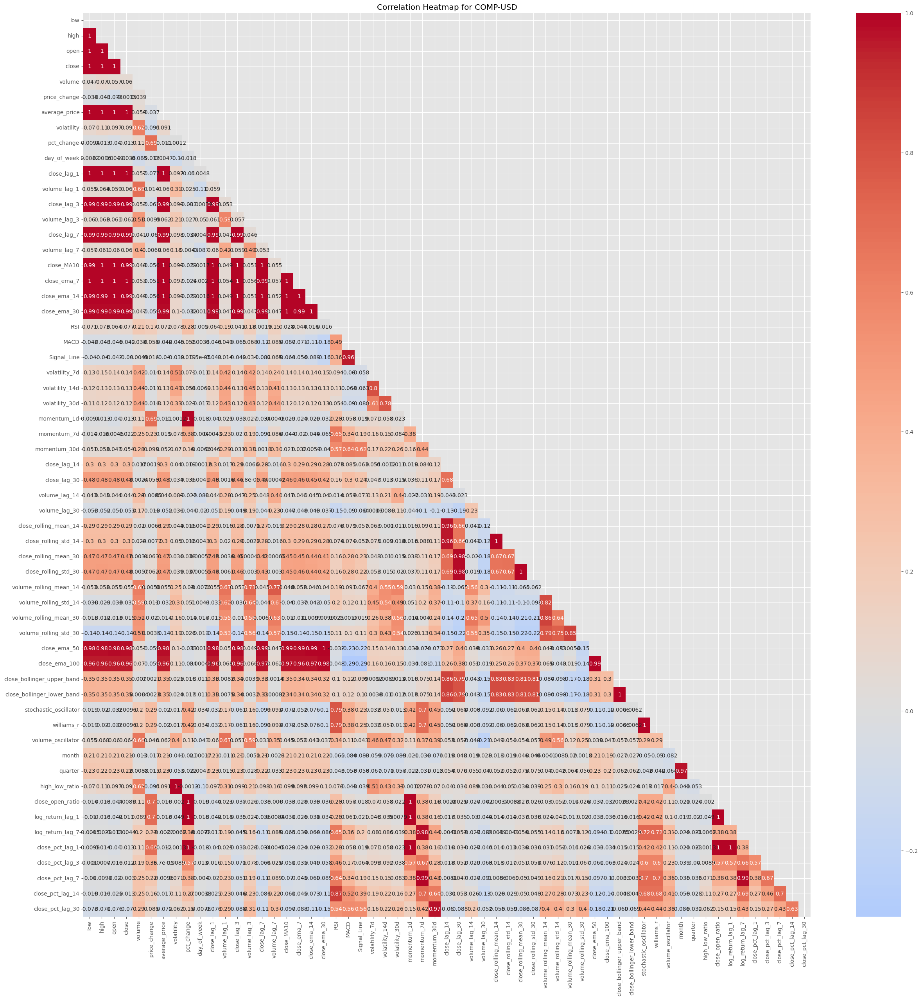

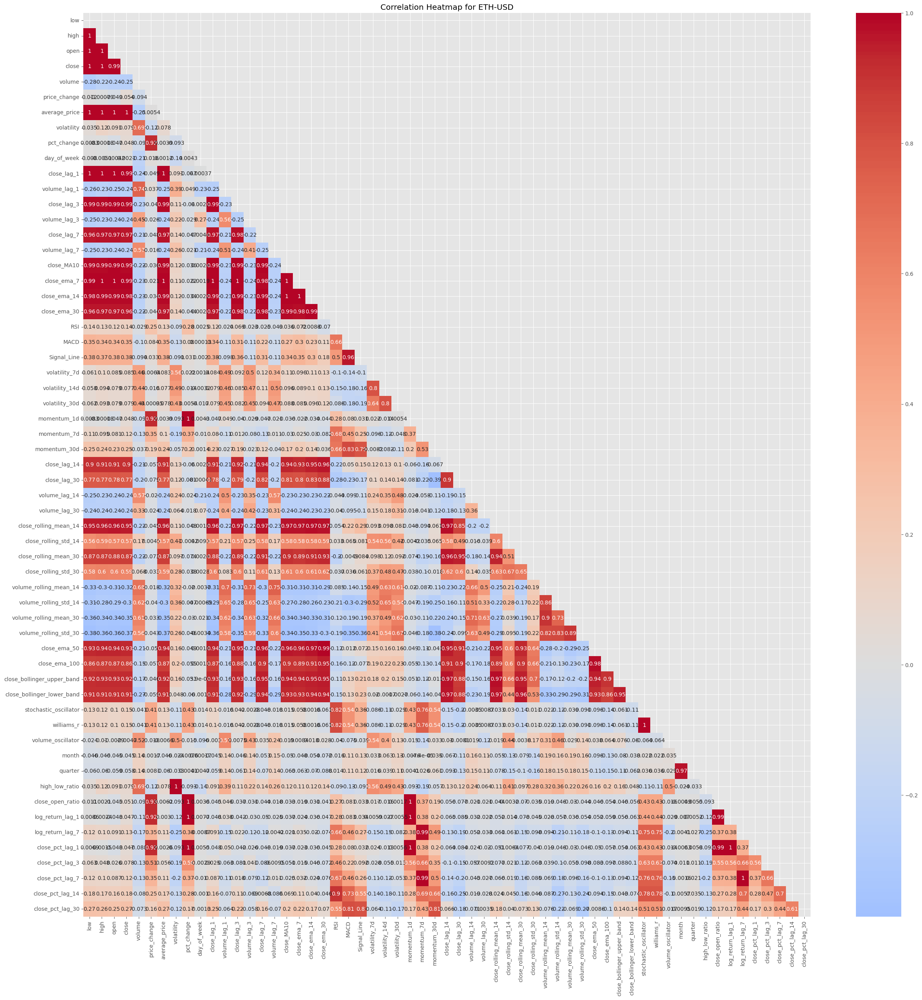

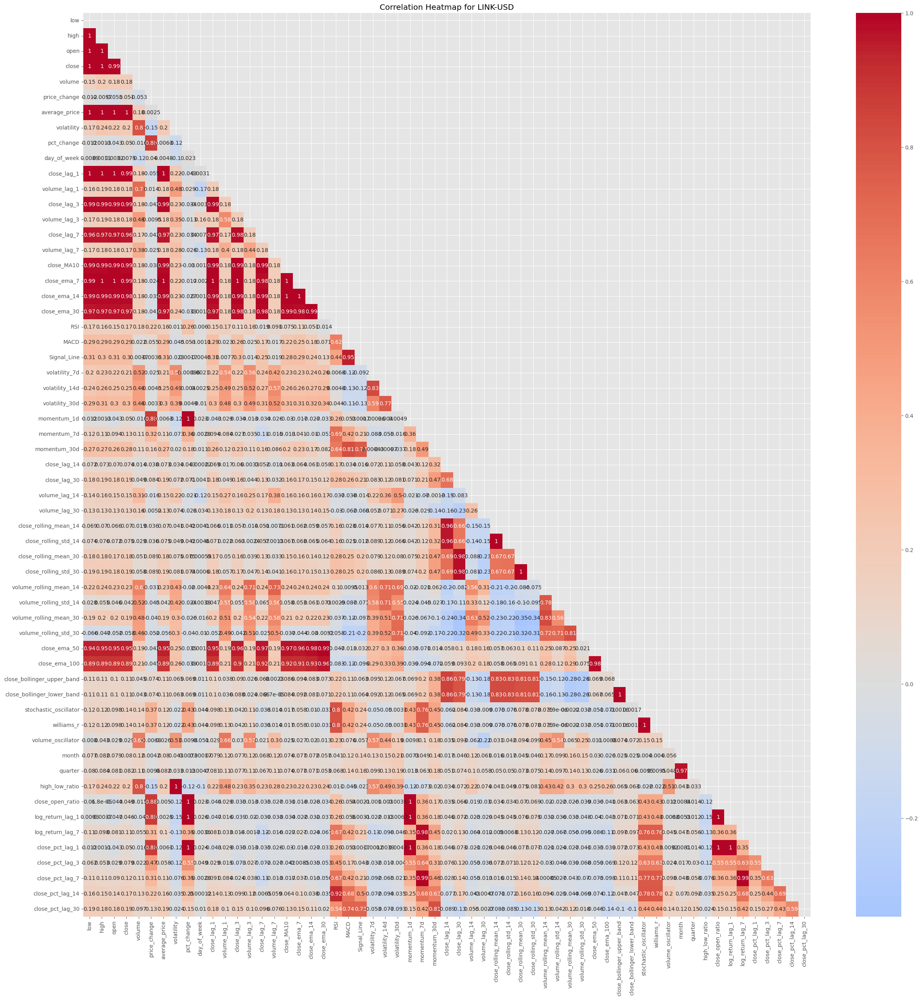

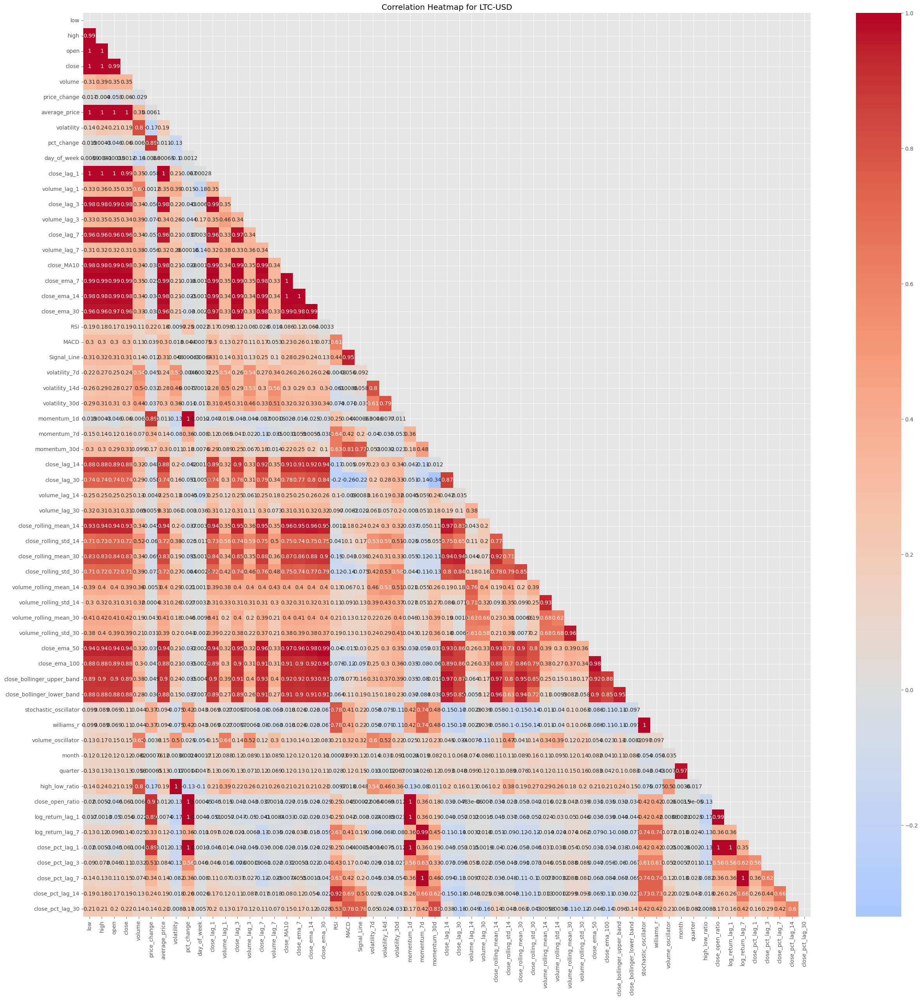

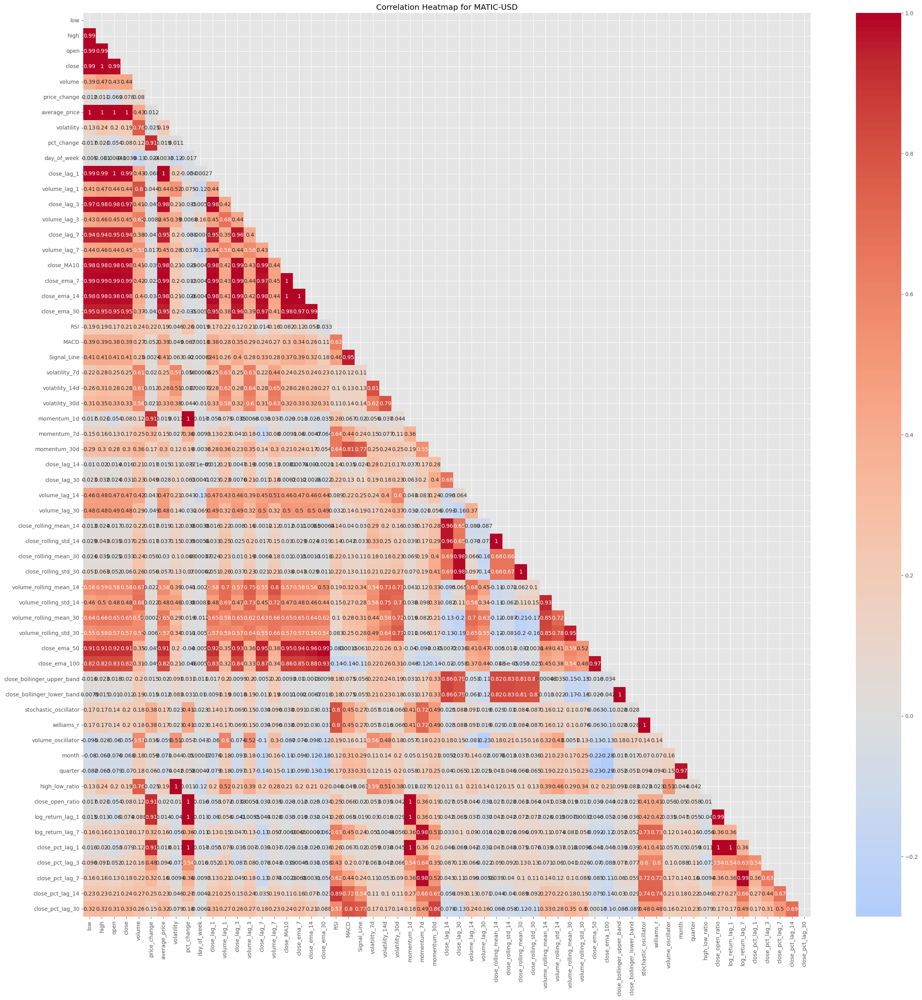

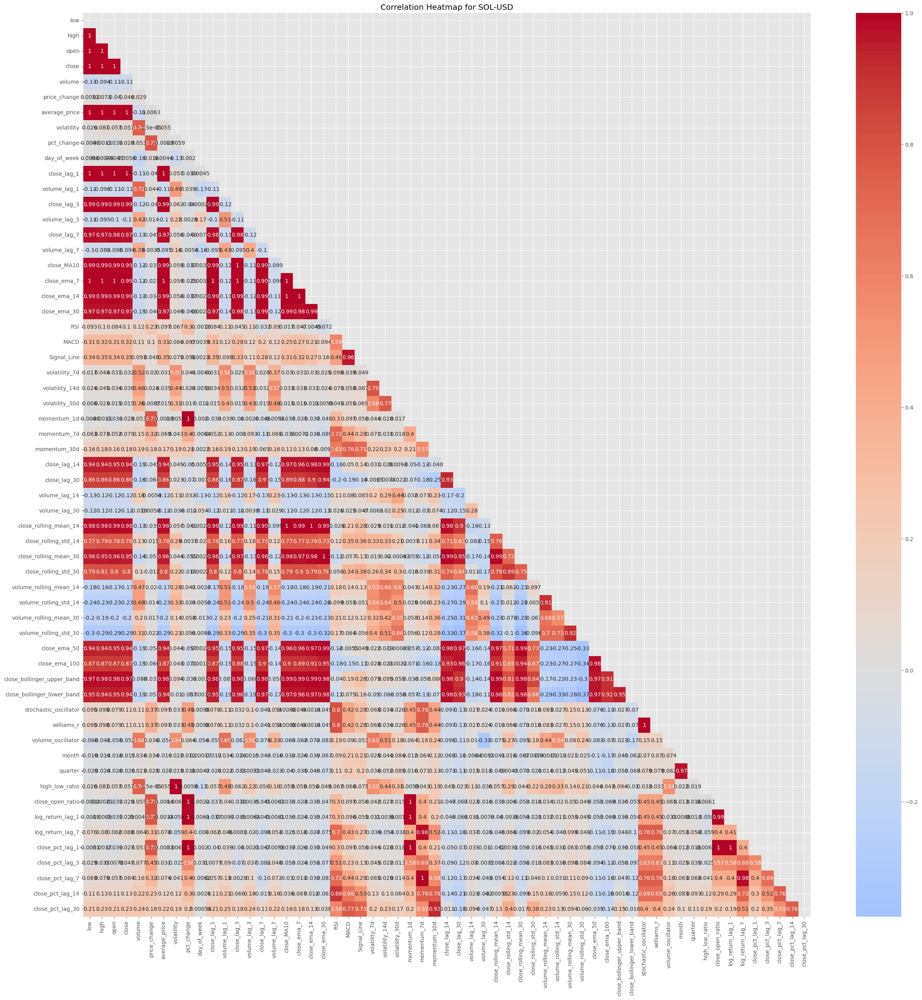

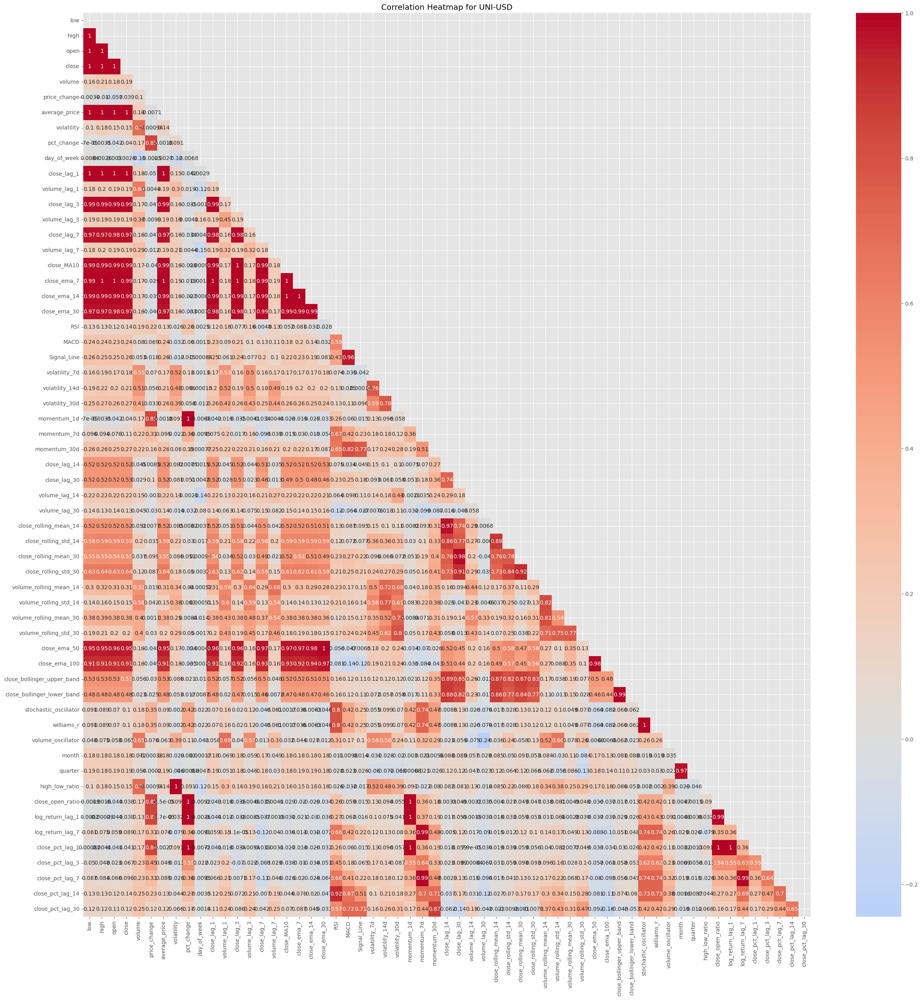

Columns to drop for ADA-USD: ['high', 'open', 'close', 'average_price', 'close_lag_1', 'close_lag_3', 'close_lag_7', 'close_MA10', 'close_ema_7', 'close_ema_14', 'close_ema_30', 'Signal_Line', 'momentum_1d', 'close_lag_14', 'close_lag_30', 'close_rolling_mean_14', 'close_rolling_mean_30', 'volume_rolling_mean_30', 'volume_rolling_std_30', 'close_ema_50', 'close_ema_100', 'close_bollinger_upper_band', 'close_bollinger_lower_band', 'williams_r', 'quarter', 'high_low_ratio', 'close_open_ratio', 'log_return_lag_1', 'log_return_lag_7', 'close_pct_lag_1', 'close_pct_lag_7', 'close_pct_lag_30']
Columns to drop for AVAX-USD: ['high', 'open', 'close', 'average_price', 'close_lag_1', 'close_lag_3', 'close_lag_7', 'close_MA10', 'close_ema_7', 'close_ema_14', 'close_ema_30', 'Signal_Line', 'momentum_1d', 'close_lag_14', 'close_rolling_mean_14', 'close_rolling_mean_30', 'volume_rolling_mean_14', 'volume_rolling_std_14', 'volume_rolling_mean_30', 'volume_rolling_std_30', 'close_ema_50', 'close_ema_1

In [12]:
# Function to generate heatmap and identify columns to drop due to high multicollinearity for each product_id
def analyze_multicollinearity(df, threshold=0.9):
    product_ids = df['product_id'].unique()
    columns_to_drop = {}
    
    for product_id in product_ids:
        group = df[df['product_id'] == product_id]
        numeric_group = group.select_dtypes(include=[np.number])
        
        # Calculate the correlation matrix
        corr_matrix = numeric_group.corr()
        
        # Create a mask for the upper triangle
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
        
        # Set up the matplotlib figure
        plt.figure(figsize=(30, 30))
        
        # Draw the heatmap
        sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0)
        plt.title(f'Correlation Heatmap for {product_id}')
        plt.show()
        
        # Identify columns with correlation greater than the threshold
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
        
        columns_to_drop[product_id] = to_drop
        
    return columns_to_drop

# Analyze multicollinearity for each product_id
columns_to_drop = analyze_multicollinearity(df, threshold=0.9)

# Display the columns to drop for each product_id
for product_id, cols in columns_to_drop.items():
    print(f"Columns to drop for {product_id}: {cols}")


The multicollinearity analysis has been performed for each product_id, and the columns with high multicollinearity (correlation greater than 0.9) have been identified. Each product_id has a list of columns that should be considered for removal to reduce multicollinearity in the dataset.



In [13]:
# Drop the identified columns while retaining pct_change
def drop_highly_correlated_features(df, columns_to_drop):
    df_list = []
    
    for product_id, group in df.groupby('product_id'):
        cols_to_drop = columns_to_drop.get(product_id, [])
        
        # Remove pct_change from the drop list if it exists
        cols_to_drop = [col for col in cols_to_drop if col != 'pct_change']
        
        # Drop the columns for the current group
        group = group.drop(columns=cols_to_drop, errors='ignore')
        df_list.append(group)
    
    # Combine the processed groups back into a single DataFrame
    df_cleaned = pd.concat(df_list)
    return df_cleaned

# Drop the highly correlated features
df = drop_highly_correlated_features(df, columns_to_drop)

# Validate the DataFrame after dropping columns
print(df.head())
print(df.isnull().sum())


         time product_id     low       volume  price_change  volatility  \
0  2021-07-16    ADA-USD  1.1661  36764908.57       -0.0535    6.783295   
12 2021-07-17    ADA-USD  1.1503  30485996.64        0.0016    3.920716   
19 2021-07-18    ADA-USD  1.1674  20204036.80        0.0084    4.445777   
34 2021-07-19    ADA-USD  1.1159  38666530.06       -0.0590    6.837530   
37 2021-07-20    ADA-USD  1.0250  98783713.28       -0.0669   10.878049   

    pct_change  day_of_week  day_name  volume_lag_1  volume_lag_3  \
0     0.001366          4.0    Friday   36764908.57   36764908.57   
12    0.001366          5.0  Saturday   36764908.57   36764908.57   
19    0.007246          6.0    Sunday   30485996.64   36764908.57   
34   -0.049852          6.0    Monday   20204036.80   36764908.57   
37   -0.059416          1.0   Tuesday   38666530.06   30485996.64   

    volume_lag_7        RSI      MACD  volatility_7d  volatility_14d  \
0    36764908.57  65.086888  0.000128       0.145345        0.

Group Processing: The DataFrame is processed in groups by product_id.
Drop Columns per Group: The identified columns are dropped for each product_id group while retaining pct_change.
Combine Groups: The cleaned groups are concatenated back into a single DataFrame.

The identified highly correlated lagged features have been successfully dropped from the DataFrame while retaining the pct_change column as the target variable. The updated DataFrame now has reduced multicollinearity, which should help improve model performance and interpretability.

In [14]:
# Function to handle remaining null values
def impute_remaining_nulls(df):
    # Identify columns with null values
    cols_with_nulls = df.columns[df.isnull().any()]
    
    # Apply imputation methods to these columns
    for col in cols_with_nulls:
        df[col] = df[col].ffill().bfill().interpolate(method='linear')
    
    return df

# Impute remaining null values
df = impute_remaining_nulls(df)

# Verify no null values remain
print("Null values after final imputation:")
print(df.isnull().sum())


Null values after final imputation:
time                          0
product_id                    0
low                           0
volume                        0
price_change                  0
volatility                    0
pct_change                    0
day_of_week                   0
day_name                      0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
MACD                          0
volatility_7d                 0
volatility_14d                0
volatility_30d                0
momentum_7d                   0
momentum_30d                  0
volume_lag_14                 0
volume_lag_30                 0
close_rolling_std_14          0
close_rolling_std_30          0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
month                         0
close_pct_lag_3               0
close_pct_lag_14              0
clos

The imputation process has successfully addressed all remaining null values in the DataFrame. The dataset is now fully clean and ready for further steps.

### Re-evaluating the Correlation Matrix


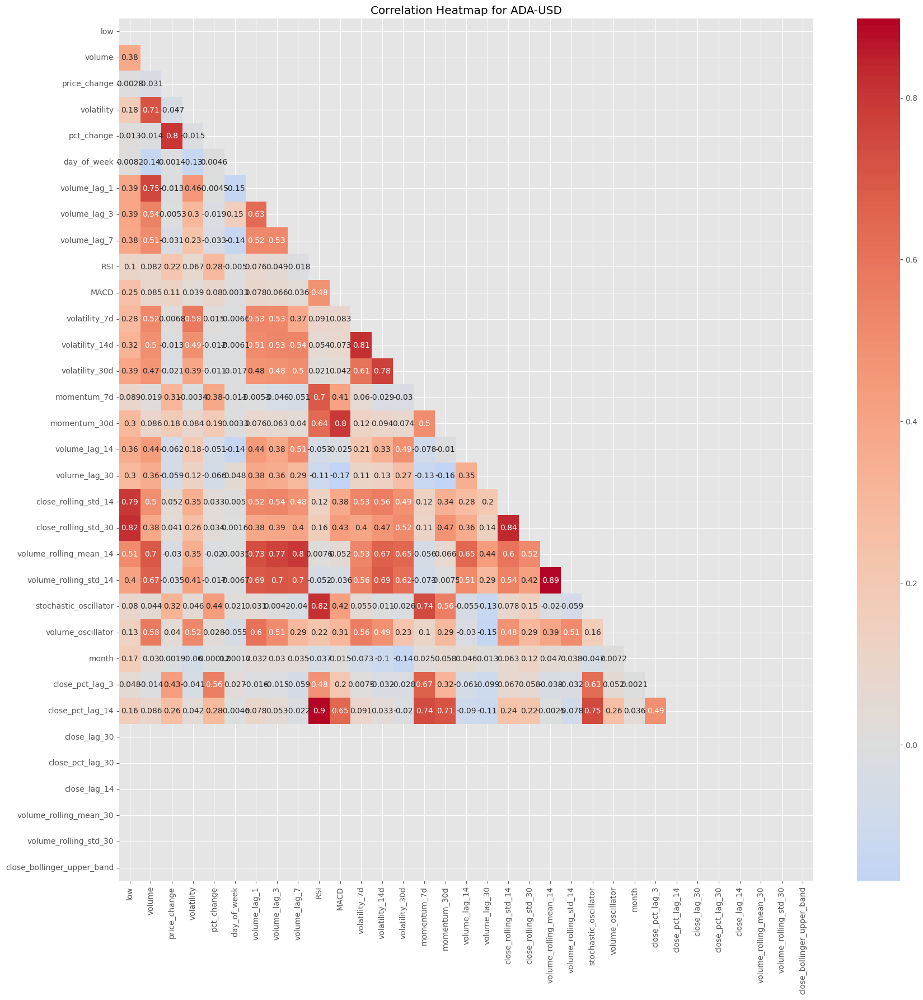

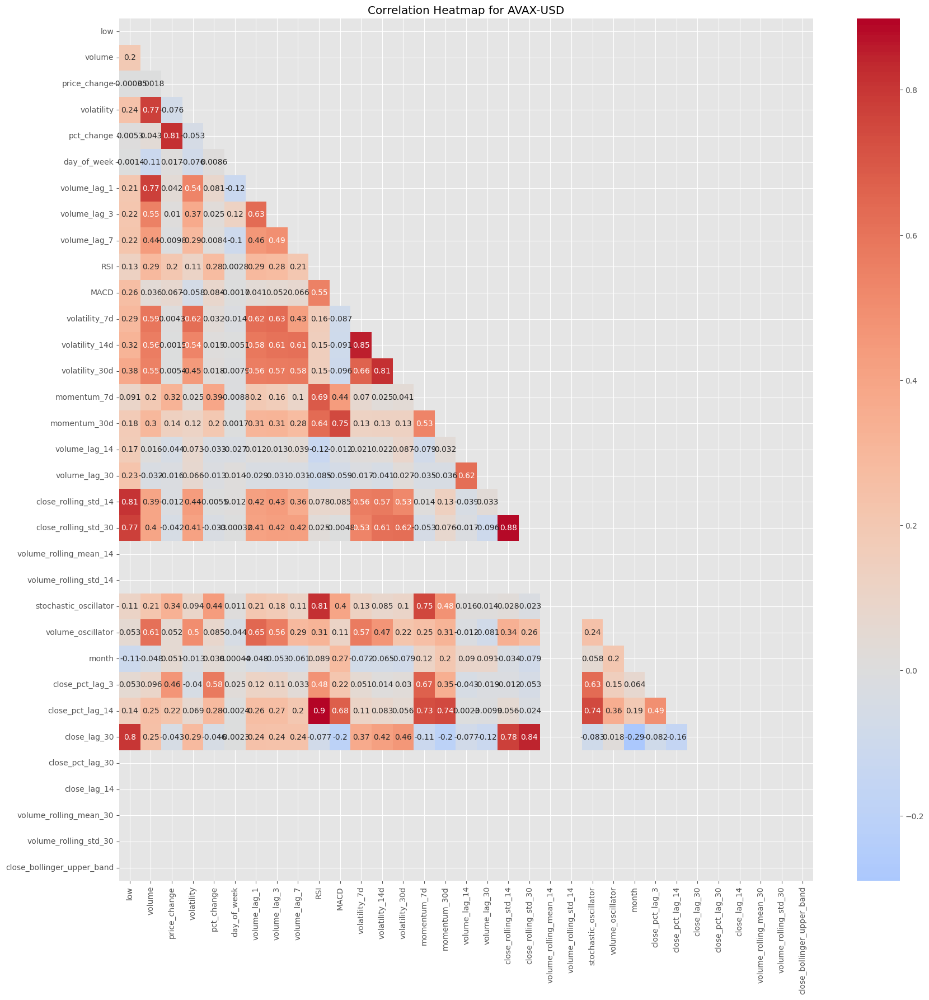

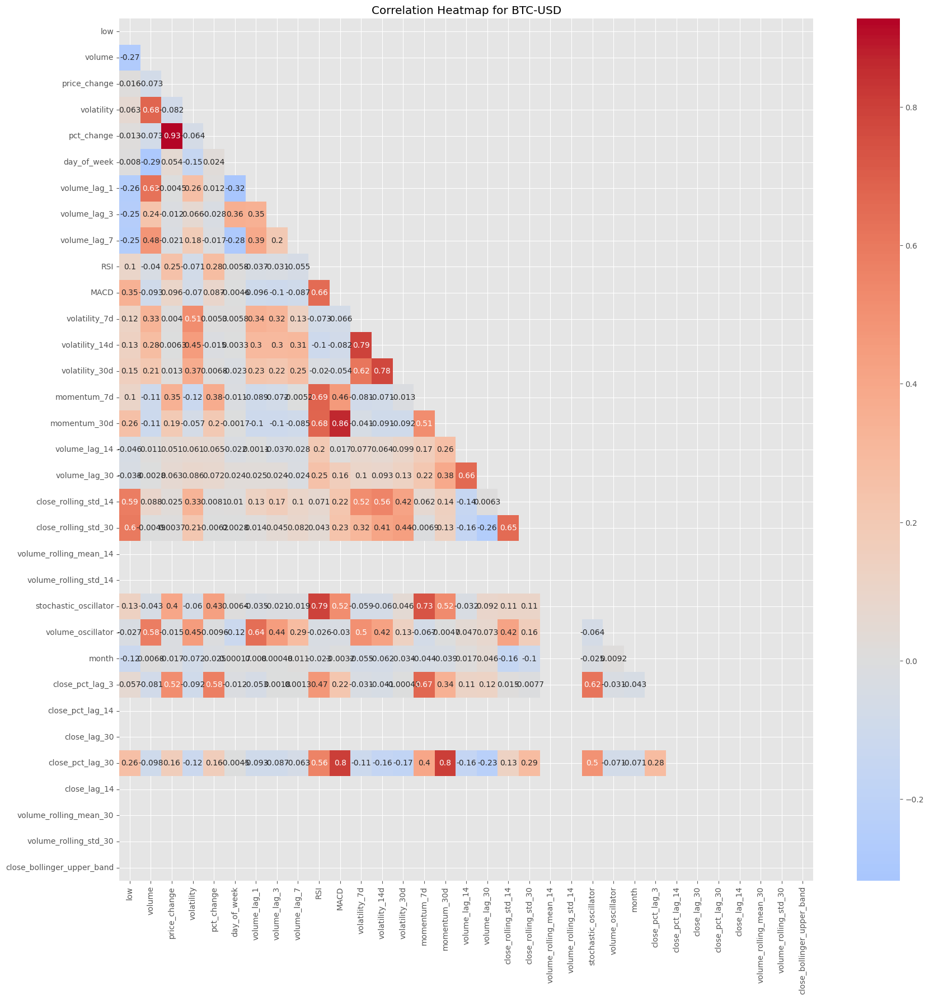

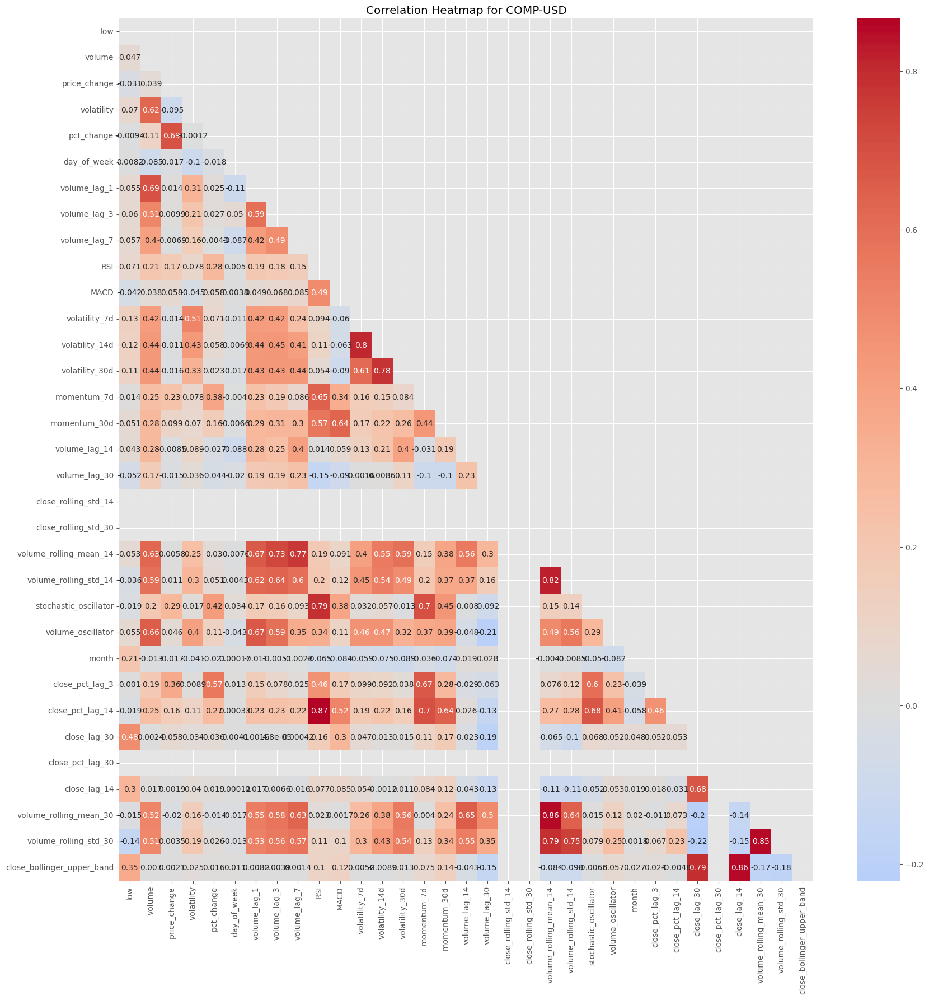

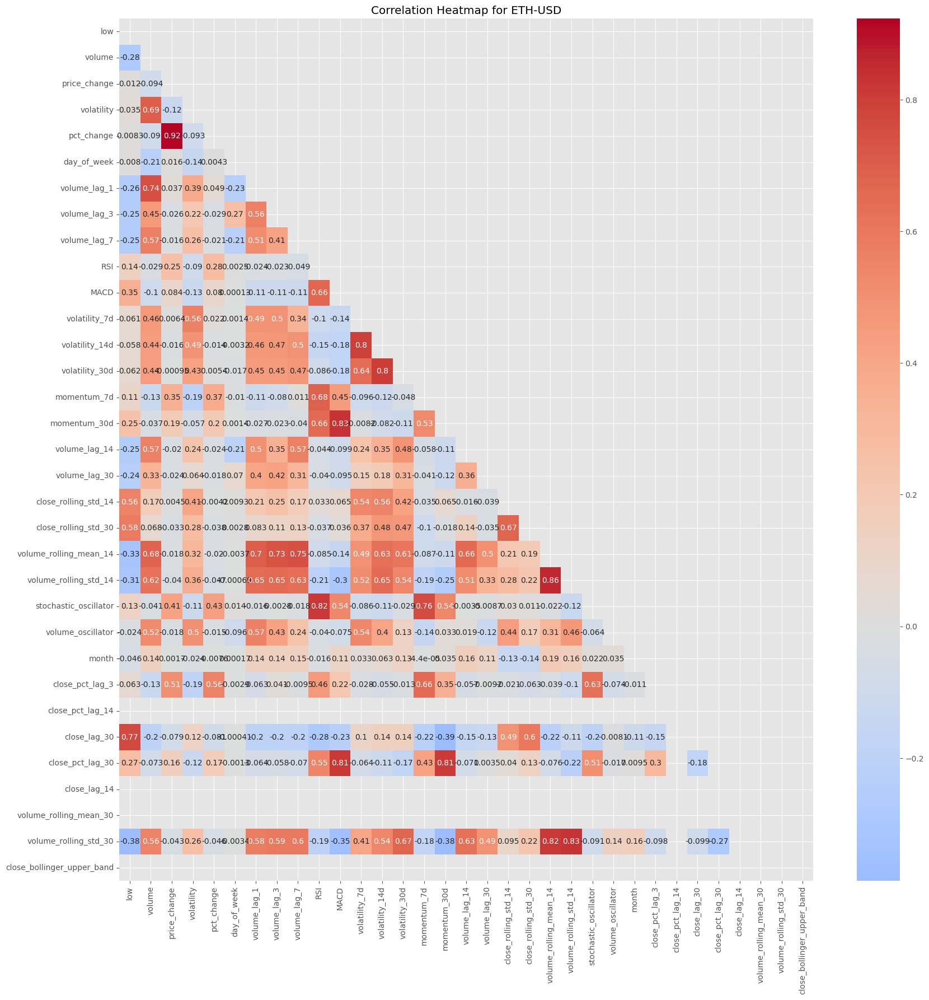

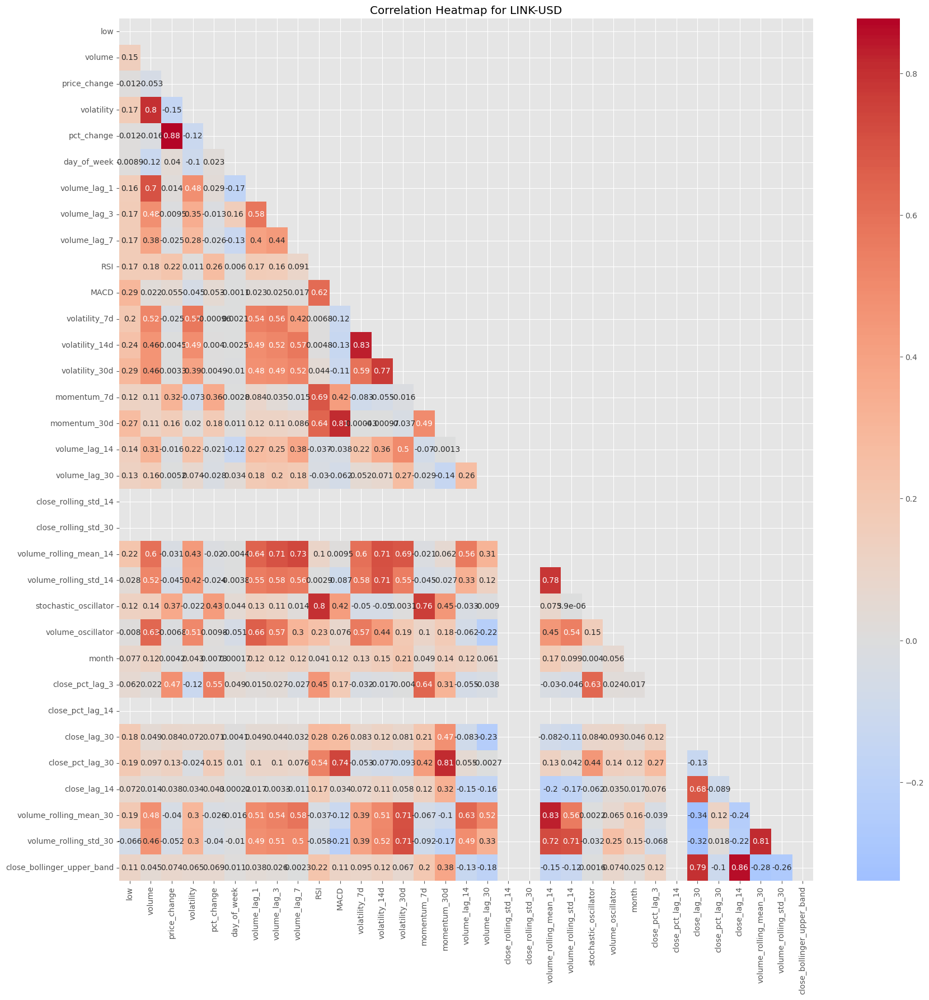

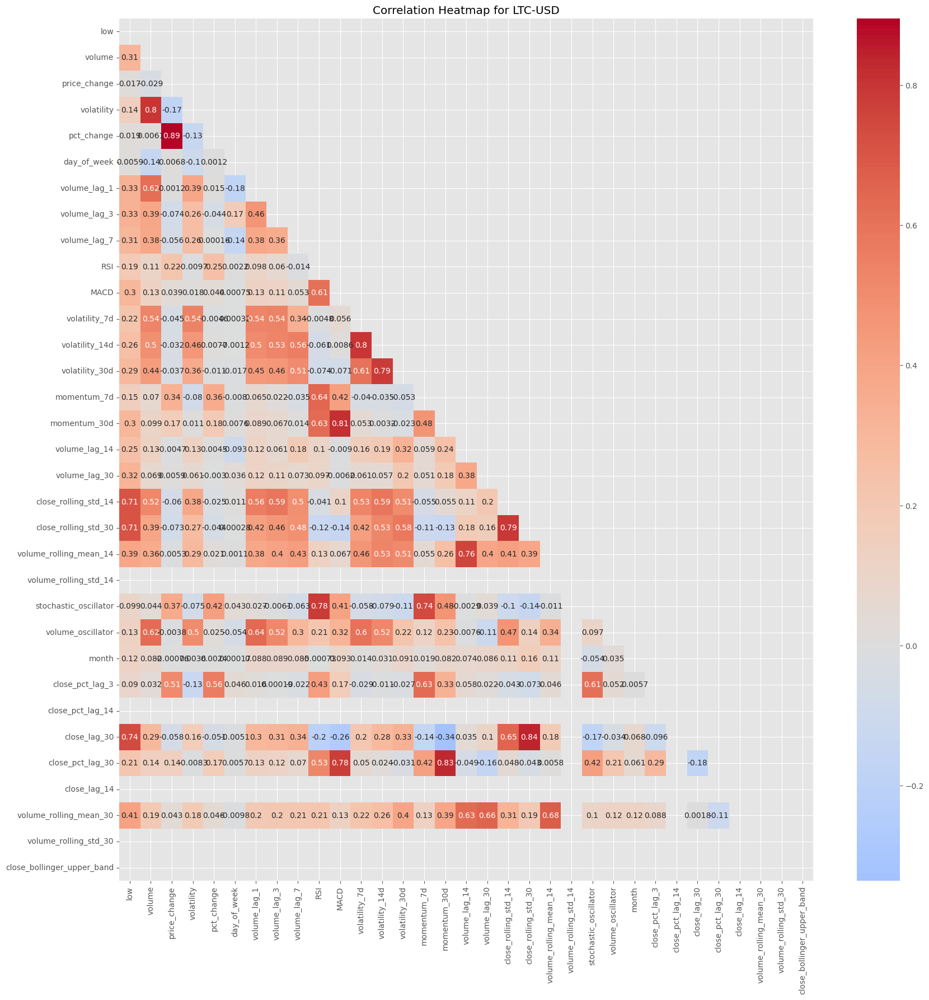

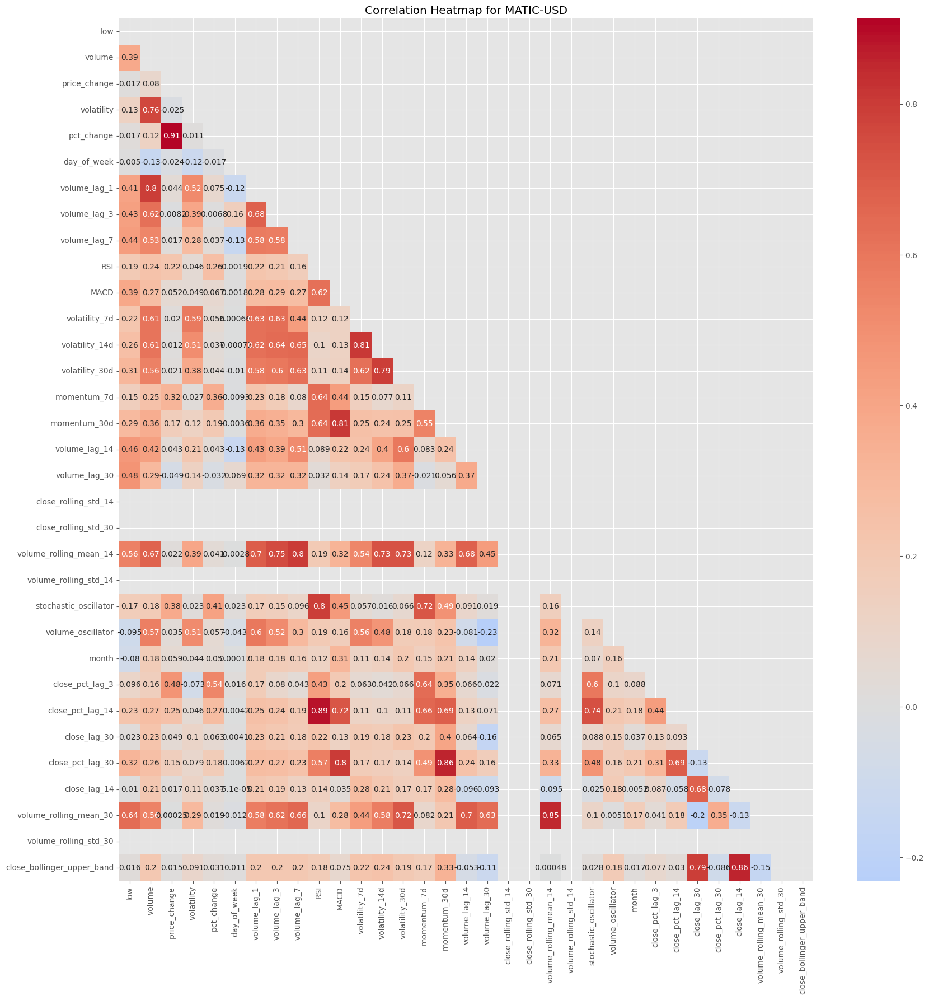

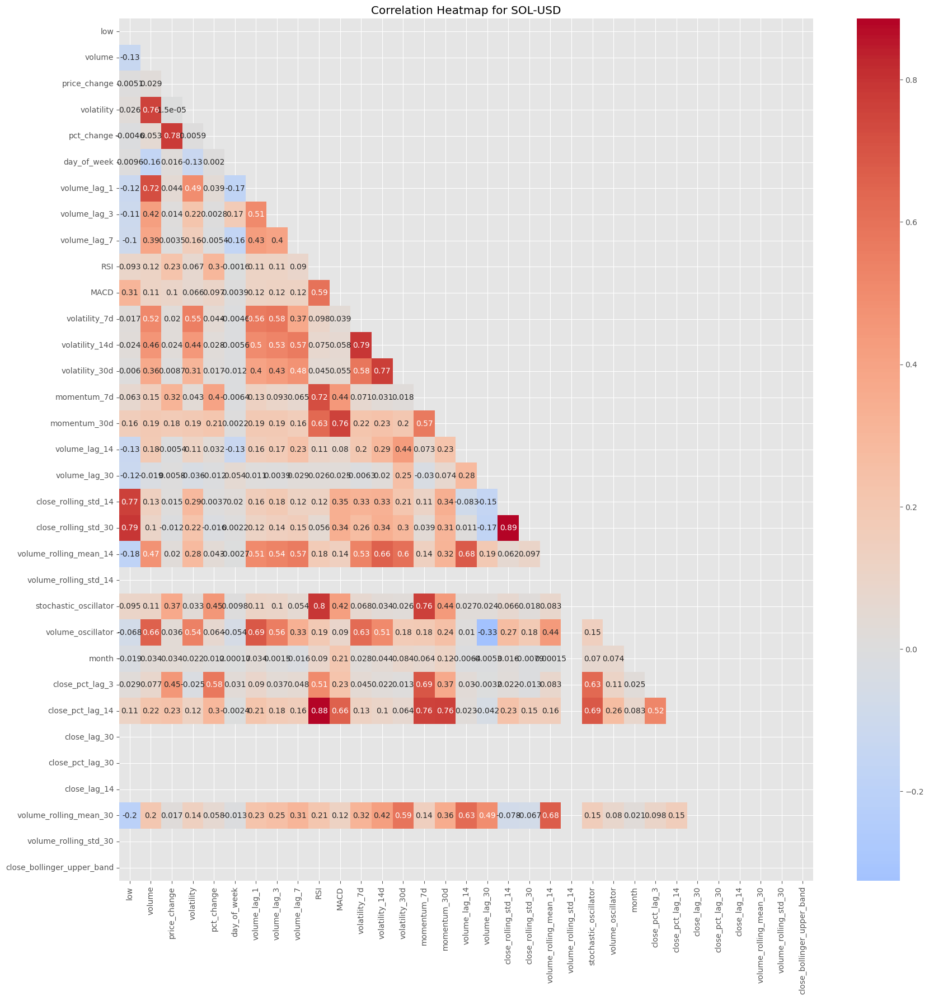

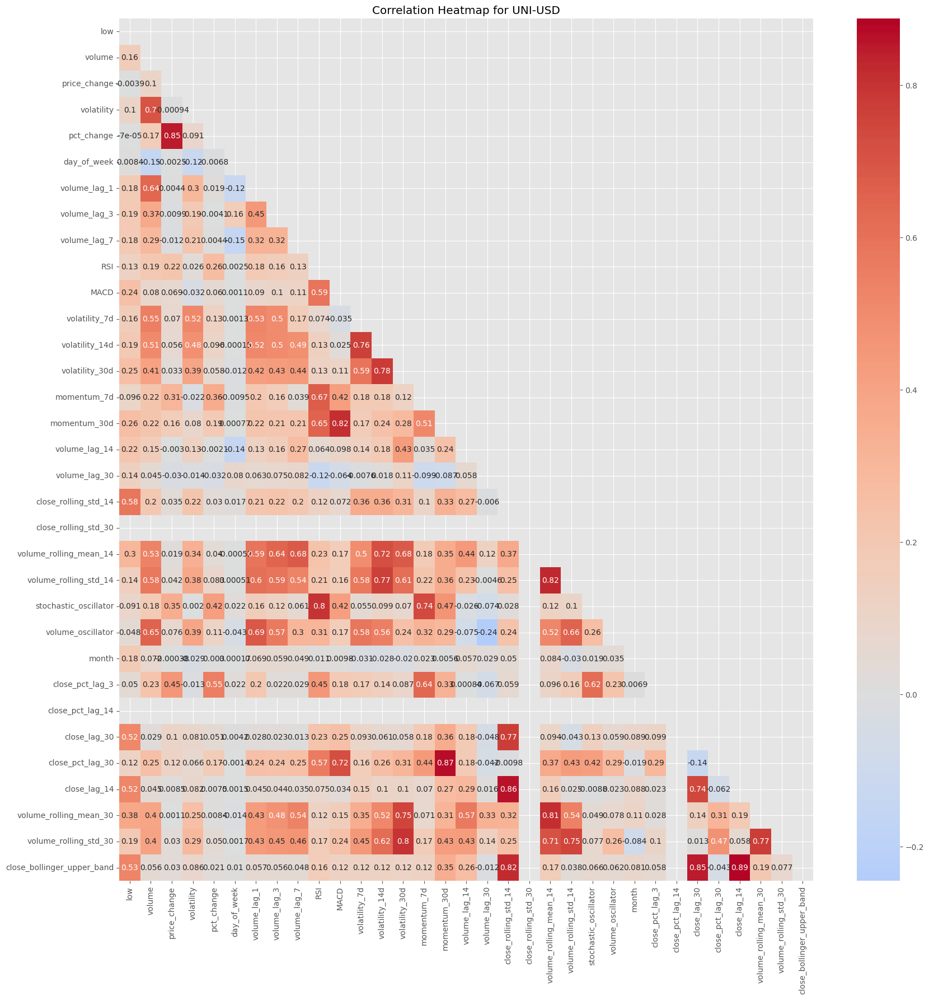

Columns to drop for ADA-USD: []
Columns to drop for AVAX-USD: []
Columns to drop for BTC-USD: ['pct_change']
Columns to drop for COMP-USD: []
Columns to drop for ETH-USD: ['pct_change']
Columns to drop for LINK-USD: []
Columns to drop for LTC-USD: []
Columns to drop for MATIC-USD: ['pct_change']
Columns to drop for SOL-USD: []
Columns to drop for UNI-USD: []


In [15]:
# Re-evaluate the correlation matrix and drop columns with high multicollinearity
def analyze_multicollinearity(df, threshold=0.9):
    product_ids = df['product_id'].unique()
    columns_to_drop = {}

    for product_id in product_ids:
        group = df[df['product_id'] == product_id]
        numeric_group = group.select_dtypes(include=[np.number])

        # Calculate the correlation matrix
        corr_matrix = numeric_group.corr()

        # Create a mask for the upper triangle
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

        # Set up the matplotlib figure
        plt.figure(figsize=(20, 20))

        # Draw the heatmap
        sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', center=0)
        plt.title(f'Correlation Heatmap for {product_id}')
        plt.show()

        # Identify columns with correlation greater than the threshold
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
        to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

        columns_to_drop[product_id] = to_drop

    return columns_to_drop

# Analyze multicollinearity for each product_id
columns_to_drop = analyze_multicollinearity(df, threshold=0.9)

# Display the columns to drop for each product_id
for product_id, cols in columns_to_drop.items():
    print(f"Columns to drop for {product_id}: {cols}")


### Implementing Feature Importance
Next, let's use Lasso regression to determine the importance of each feature and drop less important ones.

In [16]:

def feature_importance_lasso(df, target_variable='pct_change'):
    product_ids = df['product_id'].unique()
    important_features = {}

    for product_id in product_ids:
        group = df[df['product_id'] == product_id]
        
        # Drop non-numeric columns and the target variable
        X = group.select_dtypes(include=[np.number]).drop(columns=[target_variable])
        y = group[target_variable]

        # Apply Lasso regression
        lasso = Lasso(alpha=0.01)
        lasso.fit(X, y)
        
        # Get feature importance
        importance = np.abs(lasso.coef_)
        important_features[product_id] = X.columns[importance > 0]

    return important_features

# Determine important features using Lasso regression
important_features = feature_importance_lasso(df)

# Display the important features for each product_id
for product_id, features in important_features.items():
    print(f"Important features for {product_id}: {features}")


Important features for ADA-USD: Index(['volume', 'volume_lag_1', 'volume_lag_3', 'volume_lag_7', 'RSI',
       'volume_lag_14', 'volume_lag_30', 'volume_rolling_mean_14',
       'volume_rolling_std_14', 'stochastic_oscillator', 'volume_oscillator'],
      dtype='object')
Important features for AVAX-USD: Index(['low', 'volume', 'price_change', 'volume_lag_1', 'volume_lag_3',
       'volume_lag_7', 'RSI', 'volume_lag_14', 'volume_lag_30',
       'stochastic_oscillator', 'volume_oscillator'],
      dtype='object')
Important features for BTC-USD: Index(['low', 'volume', 'price_change', 'volume_lag_1', 'volume_lag_3',
       'volume_lag_7', 'MACD', 'volume_lag_14', 'volume_lag_30',
       'close_rolling_std_14', 'close_rolling_std_30', 'stochastic_oscillator',
       'volume_oscillator'],
      dtype='object')
Important features for COMP-USD: Index(['low', 'volume', 'price_change', 'volume_lag_1', 'volume_lag_3',
       'volume_lag_7', 'MACD', 'volume_lag_14', 'volume_lag_30',
       'volum

The Lasso regression analysis has identified the important features for each product_id. These features have been determined to have significant predictive power for the target variable (pct_change).



### Retaining only the important features identified by the Lasso regression for each product_id

In [17]:
def retain_important_features(df, important_features):
    df_list = []
    
    for product_id, group in df.groupby('product_id'):
        features_to_retain = important_features[product_id].tolist() + ['pct_change', 'product_id', 'time']
        group = group[features_to_retain]
        df_list.append(group)
    
    df_reduced = pd.concat(df_list)
    return df_reduced

# Retain only the important features
df_reduced = retain_important_features(df, important_features)

# Validate the DataFrame after retaining important features
print("Reduced DataFrame columns:", df_reduced.columns)
print("Reduced DataFrame sample:")
print(df_reduced.head())


Reduced DataFrame columns: Index(['volume', 'volume_lag_1', 'volume_lag_3', 'volume_lag_7', 'RSI',
       'volume_lag_14', 'volume_lag_30', 'volume_rolling_mean_14',
       'volume_rolling_std_14', 'stochastic_oscillator', 'volume_oscillator',
       'pct_change', 'product_id', 'time', 'low', 'price_change', 'MACD',
       'close_rolling_std_14', 'close_rolling_std_30', 'close_lag_30',
       'close_lag_14', 'volume_rolling_mean_30', 'volume_rolling_std_30',
       'close_bollinger_upper_band', 'volatility'],
      dtype='object')
Reduced DataFrame sample:
         volume  volume_lag_1  volume_lag_3  volume_lag_7        RSI  \
0   36764908.57   36764908.57   36764908.57   36764908.57  65.086888   
12  30485996.64   36764908.57   36764908.57   36764908.57  65.086888   
19  20204036.80   30485996.64   36764908.57   36764908.57  65.086888   
34  38666530.06   20204036.80   36764908.57   36764908.57  65.086888   
37  98783713.28   38666530.06   30485996.64   36764908.57  65.086888   

    

The DataFrame has been successfully reduced to retain only the important features as identified by the Lasso regression analysis. This reduced feature set should improve the model's performance and make the analysis more manageable.

The output indicates that there are still NaN values present in the DataFrame. We need to address these NaNs before proceeding with the data splitting.

In [18]:
# Function to impute remaining null values
def impute_remaining_nulls(df):
    # Identify columns with null values
    cols_with_nulls = df.columns[df.isnull().any()]
    # Apply imputation methods to these columns
    df[cols_with_nulls] = df[cols_with_nulls].ffill().bfill().interpolate(method='linear')
    return df

# Impute remaining null values
df_reduced = impute_remaining_nulls(df_reduced)

# Validate after imputation
print("Null values after final imputation:")
print(df_reduced.isnull().sum())

# Display a sample of the updated DataFrame
print(df_reduced.head())


Null values after final imputation:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
time                          0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64
         volume  volume_lag_1  volume_lag_3  volume_lag_7        RSI  \
0   36764908.57   36764908.57   36764908.57   36764908.57  65.086888   
12  304

The output indicates that there are no remaining NaN values in the dataset.

### Validation
Before proceeding with splitting the dataset, it is essential to validate the data to ensure it is consistent and ready for modeling. This involves checking:

In [19]:
# Ensure 'time' column is of datetime type
df_reduced['time'] = pd.to_datetime(df_reduced['time'])

# Function to display summary statistics and distribution plots
def display_stats_and_plots(product_id):
    group = df_reduced[df_reduced['product_id'] == product_id]
    
    # Summary statistics
    print(f"Summary statistics for {product_id}:")
    display(group.describe())
    
    # Distribution plots
    key_features = ['volume', 'pct_change', 'RSI', 'MACD']
    
    for feature in key_features:
        plt.figure(figsize=(10, 6))
        sns.histplot(group[feature].dropna(), kde=True)
        plt.title(f'Distribution of {feature} for {product_id}')
        plt.show()

# Create a dropdown widget for selecting product_id
product_id_dropdown = widgets.Dropdown(
    options=df_reduced['product_id'].unique(),
    description='Product ID:',
    disabled=False,
)

# Create an interactive output
output = widgets.interactive_output(display_stats_and_plots, {'product_id': product_id_dropdown})

# Display the dropdown and output
display(product_id_dropdown, output)


Dropdown(description='Product ID:', options=('ADA-USD', 'AVAX-USD', 'BTC-USD', 'COMP-USD', 'ETH-USD', 'LINK-US…

Output()

### Outlier Detection

In [20]:
# Outlier Detection with Manual Review
def detect_outliers(df, threshold=3):
    outliers = {}
    
    for product_id, group in df.groupby('product_id'):
        outlier_indices = []
        
        for feature in group.select_dtypes(include=[np.number]).columns:
            # Calculate the Z-score
            z_scores = np.abs((group[feature] - group[feature].mean()) / group[feature].std())
            outlier_indices.extend(group[z_scores > threshold].index.tolist())
        
        outliers[product_id] = outlier_indices
    
    return outliers

# Detect outliers in the dataset
outliers = detect_outliers(df_reduced)

# Display the outliers detected for each product_id
for product_id, indices in outliers.items():
    print(f"Outliers detected for {product_id}: {len(indices)} instances")

# Optionally, review and remove the outliers
for product_id, indices in outliers.items():
    print(f"Reviewing outliers for {product_id}:")
    display(df_reduced.loc[indices])
    # Decide to keep or remove based on manual review
    # Uncomment the following line to remove outliers after review
    # df_reduced = df_reduced.drop(index=indices)

Outliers detected for ADA-USD: 196 instances
Outliers detected for AVAX-USD: 196 instances
Outliers detected for BTC-USD: 221 instances
Outliers detected for COMP-USD: 347 instances
Outliers detected for ETH-USD: 216 instances
Outliers detected for LINK-USD: 290 instances
Outliers detected for LTC-USD: 270 instances
Outliers detected for MATIC-USD: 252 instances
Outliers detected for SOL-USD: 255 instances
Outliers detected for UNI-USD: 217 instances
Reviewing outliers for ADA-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
309,2.323943e+08,1.511903e+08,9.298750e+07,1.265656e+08,81.265568,4.452103e+07,9.878371e+07,1.237003e+08,5.818395e+07,99.236571,2.939126e+07,0.159888,ADA-USD,2021-08-19,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
478,3.129912e+08,7.538779e+07,9.461682e+07,1.039540e+08,44.206009,2.154901e+08,4.919783e+07,1.285305e+08,6.280215e+07,47.500912,1.071144e+07,-0.109739,ADA-USD,2021-09-07,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
487,2.240117e+08,3.129912e+08,7.611942e+07,9.337881e+07,42.215051,1.262153e+08,5.858255e+07,1.355159e+08,6.776746e+07,42.593944,1.542546e+07,-0.021317,ADA-USD,2021-09-08,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
600,2.230084e+08,4.682106e+07,6.483210e+07,1.628712e+08,26.594621,7.538779e+07,8.416826e+07,1.451075e+08,7.724753e+07,11.579064,-3.819980e+06,-0.088512,ADA-USD,2021-09-20,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
961,2.207114e+08,7.928272e+07,5.679910e+07,7.862330e+07,28.042245,6.461806e+07,7.451089e+07,7.644027e+07,4.743405e+07,13.873474,2.753602e+06,-0.106073,ADA-USD,2021-10-27,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4728,1.713408e+08,2.457323e+08,8.389401e+07,6.733957e+07,46.185185,1.003744e+08,1.017800e+08,1.173723e+08,5.758876e+07,44.384615,2.390427e+07,0.157017,ADA-USD,2022-11-10,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
7169,9.662335e+07,2.178042e+07,2.353351e+07,2.440023e+07,79.327611,1.846601e+07,4.147349e+07,2.650815e+07,2.133142e+07,89.431705,1.545539e+06,0.235294,ADA-USD,2023-07-13,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
8640,1.232661e+08,5.905284e+07,5.157220e+07,2.554698e+07,86.538462,3.668203e+07,3.846717e+07,4.105369e+07,2.897194e+07,76.529284,8.154851e+06,0.197937,ADA-USD,2023-12-08,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
8685,1.199258e+08,8.277179e+07,7.759630e+07,7.008145e+07,86.491318,1.961279e+07,5.565501e+07,7.101966e+07,4.106711e+07,95.353340,1.688165e+07,0.154245,ADA-USD,2023-12-13,64.68,-1.32,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852


Reviewing outliers for AVAX-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
2145,4101530.544,2026855.018,1958087.590,1932615.468,38.936330,1782024.433,1755746.119,1.936584e+07,1.321576e+07,34.524158,246104.592700,0.039592,AVAX-USD,2022-02-24,64.62,2.91,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2906,6394106.853,2779215.494,1001669.686,776798.357,21.215273,441921.416,1263543.810,1.936584e+07,1.321576e+07,11.334675,532810.086250,-0.301751,AVAX-USD,2022-05-11,26.03,-13.45,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2920,4781979.731,6394106.853,2492923.167,1339780.562,21.751714,559700.861,917023.221,1.936584e+07,1.321576e+07,16.599448,678842.552754,-0.029260,AVAX-USD,2022-05-12,22.37,-0.95,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
3237,6221689.316,3016651.383,1833767.197,2350009.600,21.558060,2119027.184,1431190.171,1.936584e+07,1.321576e+07,10.522696,341708.158002,-0.068327,AVAX-USD,2022-06-13,14.56,-1.16,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
3251,3924658.696,6221689.316,1762912.946,2677194.941,24.782831,2347000.596,1489530.560,1.936584e+07,1.321576e+07,15.011372,409214.820386,0.027968,AVAX-USD,2022-06-14,14.64,0.46,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2056,1231937.385,1163363.116,1389497.499,2016984.696,66.763104,1613042.956,490865.518,1.936584e+07,1.321576e+07,93.094290,-14768.423608,0.137219,AVAX-USD,2022-02-15,81.47,11.18,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2189,2073955.577,1779686.779,1786783.353,1958087.590,51.929825,1163363.116,1181319.712,1.936584e+07,1.321576e+07,58.477306,172921.665586,0.126515,AVAX-USD,2022-02-28,71.89,9.52,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2846,1339780.562,776798.357,1092641.677,559700.861,31.362049,558591.018,985436.056,1.936584e+07,1.321576e+07,17.915162,-529.397813,-0.122771,AVAX-USD,2022-05-05,56.57,-8.24,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2888,2492923.167,1001669.686,860686.814,1092641.677,21.645796,939862.632,484719.798,1.936584e+07,1.321576e+07,0.249454,111851.306462,-0.200892,AVAX-USD,2022-05-09,41.13,-10.41,11.634758,1.587623,2.528716,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852


Reviewing outliers for BTC-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
2891,55136.453328,22357.511521,28626.648782,17946.983463,51.424785,20515.875330,4805.716898,1.936584e+07,1.321576e+07,0.631711,4174.520543,-0.116071,BTC-USD,2022-05-09,30010.00,-3955.22,-1995.051305,2616.284442,2489.654298,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2903,55818.019003,55136.453328,11372.453192,17946.994501,51.424785,21648.114249,5770.493681,1.936584e+07,1.321576e+07,11.883225,5990.215267,0.030724,BTC-USD,2022-05-10,29735.05,924.12,-2257.113565,3062.811484,2797.738527,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2913,61128.252963,55818.019003,22357.511521,21513.954190,51.424785,20832.196492,17229.372901,1.936584e+07,1.321576e+07,10.143093,7742.018802,-0.065480,BTC-USD,2022-05-11,27682.38,-2030.05,-2598.652218,3573.495302,3286.706186,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
2921,70702.609318,61128.252963,55136.453328,28832.997923,51.424785,16718.830573,13866.418474,1.936584e+07,1.321576e+07,24.513495,9700.632465,-0.001049,BTC-USD,2022-05-12,25338.53,-35.80,-2839.049484,3833.604085,3669.225025,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
3236,81724.844694,18661.941939,23208.770566,20384.912210,51.424785,24915.372760,15245.468184,1.936584e+07,1.321576e+07,5.169840,2859.173250,-0.154178,BTC-USD,2022-06-13,21920.00,-4094.20,-1387.127988,2361.373475,1714.593285,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9628,12631.850841,16532.825303,34226.602618,12163.057134,51.424785,7314.176300,13816.273513,1.936584e+07,1.321576e+07,62.412078,1470.928750,0.047344,BTC-USD,2024-03-17,64505.00,3089.42,4170.667904,2673.851223,7808.046005,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
9637,20057.375800,12631.850841,40195.842312,32332.725832,51.424785,40600.366569,5387.348658,1.936584e+07,1.321576e+07,57.411698,1073.026574,-0.010690,BTC-USD,2024-03-18,66562.65,-741.25,3830.736286,2689.202553,7644.380134,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
9644,40111.975540,20057.375800,16532.825303,29420.192777,51.424785,65575.095373,3997.171439,1.936584e+07,1.321576e+07,3.246423,2032.964557,-0.084403,BTC-USD,2024-03-19,61506.00,-5703.12,3065.512069,2984.825906,7405.842952,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852
9662,38590.783455,40111.975540,12631.850841,21455.921957,51.424785,34655.987994,6009.014520,1.936584e+07,1.321576e+07,54.251582,2690.925466,0.096154,BTC-USD,2024-03-20,60771.14,5956.23,2905.888514,2911.774779,7179.764023,69304.05,60263.0,10606.455301,6612.484287,66623.007887,10.851852


Reviewing outliers for COMP-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
689,112844.078,61581.323,21644.895,28150.657,51.424785,32696.517,51552.500000,31679.588071,26769.435576,25.740778,5062.503532,0.034583,COMP-USD,2021-09-30,286.77,10.63,-29.226591,2441.053423,3856.86693,442.32,422.02,33906.930000,22276.034936,455.927491,10.851852
2476,144941.281,79623.125,20282.889,24835.204,51.424785,11972.157,38376.527000,36696.575714,35418.546558,94.935093,10937.955813,0.205258,COMP-USD,2022-03-29,122.01,25.30,4.245116,2441.053423,3856.86693,107.17,104.29,27661.195433,25732.197986,136.970004,10.851852
2486,123939.096,144941.281,34985.533,13252.757,51.424785,22838.848,27296.366000,43918.022000,42059.742712,90.412953,15161.643203,0.071061,COMP-USD,2022-03-30,139.22,10.61,6.781735,2441.053423,3856.86693,121.03,110.82,30882.619767,31161.541382,146.383933,10.851852
3307,119292.324,102328.261,74206.517,82271.447,51.424785,24334.097,42800.401000,63495.728500,34237.069709,25.777512,15407.660974,0.088806,COMP-USD,2022-06-20,30.06,2.81,-10.167828,2441.053423,3856.86693,67.99,59.38,46612.659000,29048.480788,69.199906,10.851852
3316,160134.452,119292.324,90075.576,58442.483,51.424785,25779.774,32385.528000,73092.491214,41011.705591,40.285095,19997.464297,0.125790,COMP-USD,2022-06-21,33.91,4.37,-9.330208,2441.053423,3856.86693,70.42,57.24,50870.956467,35531.145228,67.910779,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,27750.415,25629.078,42934.636,30373.010,51.424785,23815.536,2631.946104,34746.670929,15155.069074,73.664451,2895.127514,0.019645,COMP-USD,2021-07-30,382.30,7.58,8.192925,2441.053423,3856.86693,69304.05,367.89,10606.455301,6612.484287,66623.007887,10.851852
143,15158.074,27750.415,35111.431,25689.984,51.424785,16444.422,2631.946104,34654.788929,15277.968461,75.087994,1475.305835,0.004501,COMP-USD,2021-07-31,393.59,1.46,8.752602,2441.053423,3856.86693,69304.05,378.94,10606.455301,6612.484287,66623.007887,10.851852
152,31240.046,15158.074,25629.078,34661.309,51.424785,11851.239,2631.946104,36039.703714,13865.338350,77.238952,1351.252003,0.006771,COMP-USD,2021-08-01,392.13,2.60,9.310725,2441.053423,3856.86693,69304.05,378.98,10606.455301,6612.484287,66623.007887,10.851852
159,31307.000,31240.046,27750.415,72494.775,51.424785,29131.186,2631.946104,36195.119000,13793.955229,75.971842,1243.037771,-0.003962,COMP-USD,2021-08-02,393.52,-1.90,9.512664,2441.053423,3856.86693,69304.05,340.39,10606.455301,6612.484287,66623.007887,10.851852


Reviewing outliers for ETH-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
2918,803672.075765,562341.548139,470978.690558,194599.912066,51.424785,167061.012721,2.012918e+05,273545.028067,216023.298603,19.969894,86469.856735,-0.058547,ETH-USD,2022-05-12,1701.00,-121.16,-224.367401,310.976882,3856.86693,3027.82,48.01,8666.815167,167538.776085,51.232366,10.851852
3243,954717.177807,308514.542634,236039.720641,184600.862862,51.424785,218864.059548,1.185202e+05,248985.359878,216606.128363,5.222769,54765.664112,-0.157251,ETH-USD,2022-06-13,1163.31,-225.15,-183.632520,197.741556,3856.86693,2053.33,48.01,8666.815167,160029.255501,51.232366,10.851852
3245,681419.510638,954717.177807,295048.584949,212923.714329,51.424785,242245.222693,1.009271e+05,280354.951874,245437.433676,14.806317,75040.985747,-0.000199,ETH-USD,2022-06-14,1074.64,-0.32,-204.195654,228.858058,3856.86693,2142.69,48.01,8666.815167,180494.235939,51.232366,10.851852
3260,827548.413938,681419.510638,308514.542634,170731.580928,51.424785,266690.708500,1.886004e+05,320416.216548,285533.137568,24.701076,100117.039180,0.023907,ETH-USD,2022-06-15,1012.72,28.87,-215.676336,250.913142,3856.86693,2020.58,48.01,8666.815167,210960.758645,51.232366,10.851852
3901,731158.989362,270253.665330,362478.812548,301803.386548,51.424785,415383.767758,3.999790e+05,368748.880842,143438.854809,1.500781,39018.873545,-0.128490,ETH-USD,2022-08-19,1602.28,-237.43,76.557123,113.032110,3856.86693,1522.12,48.01,8666.815167,124761.208199,51.232366,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4964,195680.277320,233057.327892,341051.446649,160395.219962,51.424785,309725.681306,5.950489e+05,352120.466654,149503.403063,86.540237,-46421.410902,0.031243,ETH-USD,2022-12-04,1240.27,38.77,-16.054835,57.882271,3856.86693,1644.61,48.01,8666.815167,306699.677186,51.232366,10.851852
4978,334071.846813,195680.277320,312335.429436,336303.068147,51.424785,645537.152483,1.915622e+05,329872.944820,123372.340692,77.960057,-42760.833032,-0.015981,ETH-USD,2022-12-05,1246.73,-20.44,-13.598863,49.767499,3856.86693,1627.00,48.01,8666.815167,303870.269595,51.232366,10.851852
4984,310591.432758,334071.846813,233057.327892,334230.258597,51.424785,571006.863293,2.066265e+05,311271.842639,101999.903416,78.134095,-40925.305283,0.009498,ETH-USD,2022-12-06,1241.83,11.87,-10.565621,44.295646,3856.86693,1568.34,48.01,8666.815167,301690.598526,51.232366,10.851852
5002,294892.065257,310591.432758,195680.277320,513868.949155,51.424785,488293.707164,4.203051e+05,297457.439646,88366.184024,50.392775,-40078.433625,-0.031176,ETH-USD,2022-12-07,1215.00,-39.80,-11.230111,41.828826,3856.86693,1568.34,48.01,8666.815167,302902.909772,51.232366,10.851852


Reviewing outliers for LINK-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
480,8834983.14,4184982.63,2253182.22,4120982.53,55.324094,2539239.60,2.540912e+06,3.489056e+06,1.754366e+06,35.020588,440649.661388,-0.188250,LINK-USD,2021-09-07,2822.64,-6.55941,-136.218725,195.821507,3856.86693,23.04331,25.72353,3.353691e+06,1.436745e+06,33.624204,10.851852
1335,8422260.78,3846072.15,2552652.84,2099658.95,21.871846,1573436.54,2.049801e+06,2.962685e+06,1.719104e+06,31.590278,323900.891696,-0.113152,LINK-USD,2021-12-04,2822.64,-2.62575,-136.218725,195.821507,3856.86693,31.00373,28.38554,3.047459e+06,1.622448e+06,31.425733,10.851852
1656,9725212.84,3468466.07,2326435.14,3505105.25,67.978290,2487311.69,7.281789e+06,3.437133e+06,1.962479e+06,73.049645,283496.794932,0.076398,LINK-USD,2022-01-05,2822.64,1.79000,-136.218725,195.821507,3856.86693,19.84140,19.92000,3.685337e+06,1.692250e+06,24.916805,10.851852
1675,8034336.23,6443317.27,3468466.07,2628843.82,68.000000,2314644.23,7.065918e+06,4.036080e+06,2.383280e+06,81.914894,636197.104449,0.022844,LINK-USD,2022-01-07,2822.64,0.57000,-136.218725,195.821507,3856.86693,22.93763,21.47000,3.759198e+06,1.816534e+06,26.193596,10.851852
1806,8626310.09,3628543.84,3221765.07,3748891.13,25.894482,6443317.27,2.050605e+06,4.692030e+06,2.232347e+06,2.760655,153865.439414,-0.135778,LINK-USD,2022-01-21,2822.64,-2.72000,-136.218725,195.821507,3856.86693,19.44000,25.39000,4.091297e+06,2.149573e+06,29.483275,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,5685875.49,1643580.34,3505430.29,1638273.70,81.281102,2246280.75,2.875133e+04,2.983959e+06,1.536868e+06,95.845534,376282.800314,0.151113,LINK-USD,2021-07-30,2822.64,2.92222,-136.218725,195.821507,3856.86693,3680.84000,15.23963,8.817979e+04,4.964094e+04,3713.619768,10.851852
138,3775770.25,5685875.49,3819179.10,2380283.65,81.796738,1919231.09,2.875133e+04,3.116568e+06,1.517909e+06,93.596959,386785.349400,0.019711,LINK-USD,2021-07-31,2822.64,0.43939,-136.218725,195.821507,3856.86693,3680.84000,15.35974,8.817979e+04,4.964094e+04,3713.619768,10.851852
149,3816249.20,3775770.25,1643580.34,1841029.49,77.207192,1313944.66,2.875133e+04,3.295305e+06,1.434345e+06,82.422550,394308.714761,-0.028799,LINK-USD,2021-08-01,2822.64,-0.65488,-136.218725,195.821507,3856.86693,3680.84000,15.47617,8.817979e+04,4.964094e+04,3713.619768,10.851852
153,3593371.62,3816249.20,5685875.49,6193778.21,85.578871,2750622.16,2.875133e+04,3.355501e+06,1.427395e+06,95.340429,382407.321985,0.063785,LINK-USD,2021-08-02,2822.64,1.41657,-136.218725,195.821507,3856.86693,3680.84000,14.52696,8.817979e+04,4.964094e+04,3713.619768,10.851852


Reviewing outliers for LTC-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
443,8.715598e+05,324109.735076,331552.776370,201737.522916,64.431231,191226.374675,147775.742794,281928.243615,837576.156598,91.075818,58450.165047,0.162986,LTC-USD,2021-09-03,179.87,29.82,-136.218725,195.821507,3856.86693,142.540,13.609,2.625088e+05,708140.606136,14.979493,10.851852
481,7.284108e+05,548256.672630,564488.879718,331552.776370,51.572696,199712.789414,188841.779947,388874.231767,837576.156598,24.232272,93029.861724,-0.187315,LTC-USD,2021-09-07,161.00,-41.11,-136.218725,195.821507,3856.86693,149.880,13.609,3.133952e+05,708140.606136,14.979493,10.851852
536,1.496173e+06,262913.058656,398201.551194,548256.672630,54.234183,288992.349501,224239.110792,553648.459588,837576.156598,23.881374,113656.201534,-0.019676,LTC-USD,2021-09-13,170.82,-3.65,-136.218725,195.821507,3856.86693,182.980,13.609,3.754167e+05,708140.606136,14.979493,10.851852
959,7.545150e+05,261202.600033,261962.809135,446648.210989,50.921415,341575.454831,250724.367854,346963.107200,837576.156598,16.391509,4789.371021,-0.091945,LTC-USD,2021-10-27,172.40,-18.21,-136.218725,195.821507,3856.86693,145.160,13.609,3.596549e+05,708140.606136,14.979493,10.851852
1086,1.335378e+06,648494.431764,222980.009101,316484.832926,74.364966,261202.600033,264105.742361,456054.810926,837576.156598,87.724785,65448.153049,0.144254,LTC-USD,2021-11-09,226.75,33.04,-136.218725,195.821507,3856.86693,174.920,13.609,3.836955e+05,708140.606136,14.979493,10.851852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,3.768078e+05,188841.779947,217727.616338,183456.987871,77.547199,359541.420555,891093.490000,204568.480463,837576.156598,89.488180,22283.675589,0.110355,LTC-USD,2021-08-09,145.36,16.61,-136.218725,195.821507,3856.86693,15.928,13.609,1.241741e+06,708140.606136,14.979493,10.851852
225,2.337050e+05,376807.813277,208133.599091,123513.485397,74.971522,247001.595315,891093.490000,203618.724081,837576.156598,85.558724,22221.782461,-0.005949,LTC-USD,2021-08-10,158.86,-0.88,-136.218725,195.821507,3856.86693,15.928,13.609,1.241741e+06,708140.606136,14.979493,10.851852
237,2.634940e+05,233705.005967,188841.779947,147775.742794,74.819908,286528.358637,891093.490000,201973.415275,837576.156598,86.908284,23884.957646,0.032400,LTC-USD,2021-08-11,164.30,5.34,-136.218725,195.821507,3856.86693,15.928,13.609,1.241741e+06,708140.606136,14.979493,10.851852
243,2.764241e+05,263494.035345,376807.813277,196551.829445,68.366253,177678.619026,891093.490000,209026.663188,837576.156598,67.728814,25839.615540,-0.030915,LTC-USD,2021-08-12,160.83,-5.21,-136.218725,195.821507,3856.86693,15.928,13.609,1.241741e+06,708140.606136,14.979493,10.851852


Reviewing outliers for MATIC-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
49,180321987.2,127303878.5,33695683.2,48841919.5,69.935721,2.353178e+05,8.266964e+04,2.090847e+05,837576.156598,40.700000,1.163731e+07,0.292042,MATIC-USD,2021-07-21,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,69.6700,1.895837e+05,708140.606136,14.979493,43.519211
96,193964008.8,55210713.2,99638461.9,45408560.6,69.935721,2.353178e+05,8.266964e+04,2.090847e+05,837576.156598,40.700000,1.684324e+07,0.079638,MATIC-USD,2021-07-26,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,69.6700,1.895837e+05,708140.606136,14.979493,22.037176
241,145744367.8,60266595.7,65542662.0,34317668.1,77.312094,6.166652e+07,8.266964e+04,5.905682e+07,837576.156598,87.322329,3.787919e+06,0.185669,MATIC-USD,2021-08-11,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,1.0185,1.895837e+05,708140.606136,14.979493,23.742629
244,138713370.6,145744367.8,65641691.0,45766301.9,71.474406,3.401252e+07,8.266964e+04,6.653545e+07,837576.156598,67.554729,7.747654e+06,-0.035649,MATIC-USD,2021-08-12,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,1.0283,1.895837e+05,708140.606136,14.979493,17.657815
456,139114565.1,57185556.8,104811134.1,27671208.6,56.402439,7.674954e+07,4.576630e+07,5.928732e+07,837576.156598,98.803071,3.463037e+06,0.193783,MATIC-USD,2021-09-04,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,1.5843,6.931968e+07,708140.606136,14.979493,20.686078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4707,154787851.7,82450932.3,74108030.5,21563877.8,57.364700,4.331048e+07,7.109903e+06,5.697766e+07,837576.156598,44.527576,1.691698e+07,-0.169026,MATIC-USD,2022-11-08,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,0.9176,4.032321e+07,708140.606136,14.979493,41.666667
4717,158005227.9,154787851.7,50837298.9,53435758.3,44.251586,3.455439e+07,2.250756e+07,6.579558e+07,837576.156598,9.977909,2.153111e+07,-0.219680,MATIC-USD,2022-11-09,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,0.9384,4.483980e+07,708140.606136,14.979493,40.827858
4729,154965739.5,158005227.9,82450932.3,77211789.1,58.101266,3.066454e+07,1.800018e+07,7.467424e+07,837576.156598,66.329161,2.486061e+07,0.375491,MATIC-USD,2022-11-10,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,0.9037,4.940532e+07,708140.606136,14.979493,44.602699
6839,72171835.0,22165861.7,33516238.1,3390720.2,11.575563,7.170696e+06,1.994585e+07,1.920036e+07,837576.156598,23.198399,5.444054e+06,-0.159388,MATIC-USD,2023-06-10,59.24,2.86,-136.218725,195.821507,3856.86693,79.98,0.9209,1.548489e+07,708140.606136,14.979493,43.546155


Reviewing outliers for SOL-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
422,6557518.475,4791434.929,2092854.720,2213179.660,39.472747,4654781.901,659610.671,2.777537e+06,837576.156598,69.021538,6.802437e+05,-0.018641,SOL-USD,2021-08-31,103.099,-2.057,15.759547,195.821507,3856.86693,79.98,0.5609,1.938820e+06,708140.606136,14.979493,11.913043
479,9199937.041,3112382.442,2581545.357,6557518.475,39.472747,2213179.660,383241.282,3.614982e+06,837576.156598,80.126859,8.092503e+05,0.055284,SOL-USD,2021-09-07,134.242,9.023,27.629368,195.821507,3856.86693,79.98,0.5609,2.715167e+06,708140.606136,14.979493,11.913043
489,6756738.524,9199937.041,1848408.649,3442549.797,39.472747,1664086.031,480575.521,3.978742e+06,837576.156598,93.293257,9.408080e+05,0.101672,SOL-USD,2021-09-08,146.690,17.630,30.451256,195.821507,3856.86693,79.98,0.5609,2.924373e+06,708140.606136,14.979493,11.913043
497,6536735.823,6756738.524,3112382.442,3311427.776,39.472747,3107777.074,637857.285,4.223668e+06,837576.156598,80.150529,1.024149e+06,-0.016343,SOL-USD,2021-09-09,180.901,-3.019,32.066066,195.821507,3856.86693,79.98,0.5609,3.121002e+06,708140.606136,14.979493,11.913043
2909,6151638.736,3955658.554,1166313.241,955125.782,39.472747,747646.993,1691681.478,1.732541e+06,837576.156598,13.437772,5.805420e+05,-0.239904,SOL-USD,2022-05-11,43.100,-16.060,-10.434996,195.821507,3856.86693,79.98,0.5609,1.258299e+06,708140.606136,14.979493,11.913043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,480575.521,383241.282,709576.505,731191.720,39.472747,1209188.418,4809480.600,6.954423e+05,837576.156598,86.604843,3.667926e+04,0.026188,SOL-USD,2021-08-09,36.382,0.986,3.094815,195.821507,3856.86693,79.98,0.5609,7.690694e+06,708140.606136,14.979493,11.913043
229,637857.285,480575.521,600846.645,795903.493,39.472747,704029.709,4809480.600,6.907157e+05,837576.156598,92.540518,3.436317e+04,0.052099,SOL-USD,2021-08-10,38.222,2.012,3.256896,195.821507,3856.86693,79.98,0.5609,7.690694e+06,708140.606136,14.979493,11.913043
236,705570.472,637857.285,383241.282,733114.835,39.472747,600058.970,4809480.600,6.982522e+05,837576.156598,87.216030,3.653690e+04,0.023568,SOL-USD,2021-08-11,40.634,0.959,3.423268,195.821507,3856.86693,79.98,0.5609,7.690694e+06,708140.606136,14.979493,11.913043
250,771888.110,705570.472,480575.521,830964.109,39.472747,604801.500,4809480.600,7.101870e+05,837576.156598,80.750491,4.222362e+04,-0.013157,SOL-USD,2021-08-12,39.286,-0.551,3.470889,195.821507,3856.86693,79.98,0.5609,7.690694e+06,708140.606136,14.979493,11.913043


Reviewing outliers for UNI-USD:


,volume,volume_lag_1,volume_lag_3,volume_lag_7,RSI,volume_lag_14,volume_lag_30,volume_rolling_mean_14,volume_rolling_std_14,stochastic_oscillator,volume_oscillator,pct_change,product_id,time,low,price_change,MACD,close_rolling_std_14,close_rolling_std_30,close_lag_30,close_lag_14,volume_rolling_mean_30,volume_rolling_std_30,close_bollinger_upper_band,volatility
650,3.216748e+06,7.351539e+05,7.237596e+05,3.510162e+05,50.671184,8.051999e+05,5.738479e+05,1.207839e+06,693752.048899,64.631439,157431.640947,0.235296,UNI-USD,2021-09-26,127.75,4.5606,-3.254681,195.821507,3856.86693,79.98,23.7246,1.188588e+06,6.389549e+05,14.979493,11.913043
670,3.545456e+06,1.971094e+06,7.351539e+05,1.258389e+06,44.184994,1.024806e+06,5.720736e+05,1.456971e+06,934788.542248,55.031415,309332.855091,0.030538,UNI-USD,2021-09-28,127.75,0.6890,-3.254681,195.821507,3856.86693,79.98,25.6737,1.343462e+06,7.454325e+05,14.979493,11.913043
3240,3.814149e+06,1.249243e+06,9.205318e+05,7.361756e+05,20.035993,5.980810e+05,4.593604e+05,1.034834e+06,862661.775810,9.023486,310356.773679,-0.096695,UNI-USD,2022-06-13,127.75,-0.3910,-3.254681,195.821507,3856.86693,79.98,5.6600,7.141913e+05,6.631325e+05,14.979493,11.913043
3547,3.446857e+06,1.626270e+06,1.958809e+06,9.573972e+05,73.686690,1.063455e+06,1.926702e+06,1.097846e+06,810287.244880,96.070234,185269.222862,0.146290,UNI-USD,2022-07-14,127.75,0.8990,-3.254681,195.821507,3856.86693,79.98,5.0020,1.239804e+06,6.961546e+05,14.979493,11.913043
3647,2.821408e+06,7.628515e+05,9.601841e+05,1.127905e+06,58.585005,6.698712e+05,1.179233e+06,1.506219e+06,785371.132053,72.206759,91614.254189,-0.028000,UNI-USD,2022-07-25,127.75,-0.2030,-3.254681,195.821507,3856.86693,79.98,6.2340,1.112850e+06,6.648484e+05,14.979493,11.913043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9656,7.490296e+05,8.080457e+05,5.661659e+05,5.890924e+05,27.289235,3.968157e+06,7.370949e+05,7.361705e+05,204720.610706,30.496588,-267934.840044,0.121843,UNI-USD,2024-03-20,127.75,1.2980,-3.254681,195.821507,3856.86693,79.98,15.4070,1.813794e+06,1.896445e+06,14.979493,11.913043
9672,6.187171e+05,7.490296e+05,3.298230e+05,7.484619e+05,31.837607,1.093095e+06,8.943427e+05,7.022863e+05,178705.462868,36.530652,-269170.444026,0.023520,UNI-USD,2024-03-21,127.75,0.2830,-3.254681,195.821507,3856.86693,79.98,14.9050,1.804607e+06,1.901714e+06,14.979493,11.913043
9675,4.933539e+05,6.187171e+05,8.080457e+05,7.658698e+05,31.245085,1.127124e+06,5.060199e+05,6.570170e+05,138574.714263,30.787037,-275761.673290,-0.034961,UNI-USD,2024-03-22,127.75,-0.4050,-3.254681,195.821507,3856.86693,79.98,14.6210,1.804184e+06,1.902013e+06,14.979493,11.913043
9693,2.887769e+05,4.933539e+05,7.490296e+05,6.303289e+05,32.422141,6.825384e+05,3.410219e+05,6.288912e+05,169504.468023,29.602158,-291712.548510,-0.012416,UNI-USD,2024-03-23,127.75,-0.1440,-3.254681,195.821507,3856.86693,79.98,14.1980,1.802443e+06,1.903422e+06,14.979493,11.913043


### Data Consistency and Trend Analysis


In [21]:
# Ensure 'time' column is of datetime type
df_reduced['time'] = pd.to_datetime(df_reduced['time'])

# Function to display summary statistics and distribution plots
def display_stats_and_plots(product_id):
    group = df_reduced[df_reduced['product_id'] == product_id]
    
    # Summary statistics
    print(f"Summary statistics for {product_id}:")
    display(group.describe())
    
    # Distribution plots
    key_features = ['volume', 'pct_change', 'RSI', 'MACD']
    
    for feature in key_features:
        plt.figure(figsize=(10, 6))
        sns.histplot(group[feature].dropna(), kde=True)
        plt.title(f'Distribution of {feature} for {product_id}')
        plt.show()
    
    # Trend plots
    for feature in key_features:
        plt.figure(figsize=(14, 7))
        sns.lineplot(data=group, x='time', y=feature)
        plt.title(f'Trend of {feature} over time for {product_id}')
        plt.xlabel('Time')
        plt.ylabel(feature)
        plt.show()

# Create a dropdown widget for selecting product_id
product_id_dropdown = widgets.Dropdown(
    options=df_reduced['product_id'].unique(),
    description='Product ID:',
    disabled=False,
)

# Create an interactive output
output = widgets.interactive_output(display_stats_and_plots, {'product_id': product_id_dropdown})

# Display the dropdown and output
display(product_id_dropdown, output)

Dropdown(description='Product ID:', options=('ADA-USD', 'AVAX-USD', 'BTC-USD', 'COMP-USD', 'ETH-USD', 'LINK-US…

Output()

In [22]:
# Function to check for null values
def check_null_values(df):
    null_values = df.isnull().sum()
    print("Null values in each column:")
    print(null_values[null_values > 0])

# Function to check for zero values
def check_zero_values(df):
    zero_values = (df == 0).sum()
    print("Zero values in each column:")
    print(zero_values[zero_values > 0])

# Check for null values in df_reduced
check_null_values(df_reduced)

# Check for zero values in df_reduced
check_zero_values(df_reduced)


Null values in each column:
Series([], dtype: int64)
Zero values in each column:
volume_oscillator    10
dtype: int64


In [23]:
# Replace zero values in 'volume_oscillator' with NaN and then interpolate
df_reduced['volume_oscillator'] = df_reduced['volume_oscillator'].replace(0, np.nan).interpolate().fillna(method='bfill').fillna(method='ffill')

# Verify if the zero values are handled
print("Zero values in 'volume_oscillator' after imputation:")
print((df_reduced['volume_oscillator'] == 0).sum())


Zero values in 'volume_oscillator' after imputation:
0


In [24]:
# Function to check for null values
def check_null_values(df):
    null_values = df.isnull().sum()
    print("Null values in each column:")
    print(null_values[null_values > 0])

# Function to check for zero values
def check_zero_values(df):
    zero_values = (df == 0).sum()
    print("Zero values in each column:")
    print(zero_values[zero_values > 0])

# Check for null values in df_reduced
check_null_values(df_reduced)

# Check for zero values in df_reduced
check_zero_values(df_reduced)


Null values in each column:
Series([], dtype: int64)
Zero values in each column:
Series([], dtype: int64)


## Splitting

In [25]:
# Ensure 'time' column is set as the index
df_reduced.set_index('time', inplace=True)

# Split the dataset into training and testing sets by date
train_dfs = []
test_dfs = []

for product_id, group in df_reduced.groupby('product_id'):
    split_date = '2023-12-03'  # Define the split date appropriately
    train_group = group[group.index < split_date]
    test_group = group[group.index >= split_date]
    
    train_dfs.append(train_group)
    test_dfs.append(test_group)

train_df = pd.concat(train_dfs)
test_df = pd.concat(test_dfs)

# Verify there is no overlap
overlap = train_df.index.intersection(test_df.index)
assert len(overlap) == 0, "Overlap detected between training and testing sets!"

# Validate the split
print(f"Training set shape: {train_df.shape}")
print(f"Test set shape: {test_df.shape}")
print(f"Training set start date: {train_df.index.min()}")
print(f"Training set end date: {train_df.index.max()}")
print(f"Test set start date: {test_df.index.min()}")
print(f"Test set end date: {test_df.index.max()}")


Training set shape: (8584, 24)
Test set shape: (2180, 24)
Training set start date: 2021-07-16 00:00:00
Training set end date: 2023-12-02 00:00:00
Test set start date: 2023-12-03 00:00:00
Test set end date: 2024-07-08 00:00:00


The dataset has been successfully split into training and testing sets with no overlap. The data has also been scaled appropriately using RobustScaler to account for potential outliers.

- Training set shape: (8584, 24)
- Test set shape: (2180, 24)
- Training set date range: 2021-07-16 to 2023-12-02
- Test set date range: 2023-12-03 to 2024-07-08


In [27]:
# Check for zero values before scaling
print("Zero values in training data before scaling:")
print(train_df.isin([0]).sum())



Zero values in training data before scaling:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64


In [28]:
print("Zero values in testing data before scaling:")
print(test_df.isin([0]).sum())

Zero values in testing data before scaling:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64


### Scaling and Normalization


In [29]:
# Apply RobustScaler to account for outliers
scaler = RobustScaler()

# Select numerical columns for scaling
numerical_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
numerical_cols.remove('pct_change')  # Exclude target variable

# Apply scaling to numerical columns in training set
train_df[numerical_cols] = scaler.fit_transform(train_df[numerical_cols])

# Apply scaling to numerical columns in testing set
test_df[numerical_cols] = scaler.transform(test_df[numerical_cols])

# Validate scaling
print("Scaled training data sample:")
print(train_df.head())




Scaled training data sample:
               volume  volume_lag_1  volume_lag_3  volume_lag_7       RSI  \
time                                                                        
2021-07-16  12.465977     12.471130     12.472711     12.476012  1.052737   
2021-07-17  10.300598     12.471130     12.472711     12.476012  1.052737   
2021-07-18   6.754707     10.304875     12.472711     12.476012  1.052737   
2021-07-19  13.121780      6.757548     12.472711     12.476012  1.052737   
2021-07-20  33.854111     13.127199     10.306390     12.476012  1.052737   

            volume_lag_14  volume_lag_30  volume_rolling_mean_14  \
time                                                               
2021-07-16      12.216967      12.454486                2.386157   
2021-07-17      12.216967      12.454486                2.386157   
2021-07-18      12.216967      12.454486                2.386157   
2021-07-19      12.216967      12.454486                2.386157   
2021-07-20      12.2169

The scaled training and testing sets have appropriate values after applying the RobustScaler.


In [38]:
print("Scaled testing data sample:")
print(test_df.head())

Scaled testing data sample:
               volume  volume_lag_1  volume_lag_3  volume_lag_7       RSI  \
time                                                                        
2023-12-03   9.027422      7.452002      8.189731      8.322527  0.221666   
2023-12-04  18.398967      9.031183      8.602355     10.848593  0.639044   
2023-12-05  17.572496     18.406523      7.453433      6.984117  1.935141   
2023-12-06  23.955697     17.579717      9.032661      6.557138  1.841532   
2023-12-07  20.152313     23.965503     18.408280      8.192214  1.925354   

            volume_lag_14  volume_lag_30  volume_rolling_mean_14  \
time                                                               
2023-12-03       7.663921      15.885747                1.388734   
2023-12-04      15.344869       7.827574                1.418462   
2023-12-05      15.302420      13.673694                1.439697   
2023-12-06      10.205840      18.884309                1.586545   
2023-12-07       7.03635

In [30]:
# Check for zero values after scaling
print("Zero values in training data after scaling:")
print(train_df.isin([0]).sum())

Zero values in training data after scaling:
volume                           0
volume_lag_1                     0
volume_lag_3                     0
volume_lag_7                     0
RSI                           2598
volume_lag_14                    0
volume_lag_30                    0
volume_rolling_mean_14           0
volume_rolling_std_14         2598
stochastic_oscillator            0
volume_oscillator                0
pct_change                       0
product_id                       0
low                              0
price_change                     0
MACD                           866
close_rolling_std_14          4330
close_rolling_std_30          6062
close_lag_30                  2598
close_lag_14                     0
volume_rolling_mean_30           0
volume_rolling_std_30            0
close_bollinger_upper_band       0
volatility                    5987
dtype: int64


In [31]:
print("Zero values in testing data after scaling:")
print(test_df.isin([0]).sum())

Zero values in testing data after scaling:
volume                           0
volume_lag_1                     0
volume_lag_3                     0
volume_lag_7                     0
RSI                            655
volume_lag_14                    0
volume_lag_30                    0
volume_rolling_mean_14           0
volume_rolling_std_14          655
stochastic_oscillator            0
volume_oscillator                0
pct_change                       0
product_id                       0
low                              0
price_change                     0
MACD                           219
close_rolling_std_14          1091
close_rolling_std_30          1527
close_lag_30                   655
close_lag_14                     0
volume_rolling_mean_30           0
volume_rolling_std_30            0
close_bollinger_upper_band       0
volatility                    1526
dtype: int64


In [32]:
# Investigate the columns with zero values
zero_columns = ['RSI', 'volume_rolling_std_14', 'MACD', 'close_rolling_std_14', 'close_rolling_std_30', 'close_lag_30', 'volatility']
for col in zero_columns:
    print(f"Column: {col}")
    print(f"Zero values in training data: {train_df[train_df[col] == 0].shape[0]}")
    print(f"Zero values in testing data: {test_df[test_df[col] == 0].shape[0]}")
    print(f"Percentage of zero values in training data: {train_df[train_df[col] == 0].shape[0] / train_df.shape[0] * 100:.2f}%")
    print(f"Percentage of zero values in testing data: {test_df[test_df[col] == 0].shape[0] / test_df.shape[0] * 100:.2f}%")
    print()


Column: RSI
Zero values in training data: 2598
Zero values in testing data: 655
Percentage of zero values in training data: 30.27%
Percentage of zero values in testing data: 30.05%

Column: volume_rolling_std_14
Zero values in training data: 2598
Zero values in testing data: 655
Percentage of zero values in training data: 30.27%
Percentage of zero values in testing data: 30.05%

Column: MACD
Zero values in training data: 866
Zero values in testing data: 219
Percentage of zero values in training data: 10.09%
Percentage of zero values in testing data: 10.05%

Column: close_rolling_std_14
Zero values in training data: 4330
Zero values in testing data: 1091
Percentage of zero values in training data: 50.44%
Percentage of zero values in testing data: 50.05%

Column: close_rolling_std_30
Zero values in training data: 6062
Zero values in testing data: 1527
Percentage of zero values in training data: 70.62%
Percentage of zero values in testing data: 70.05%

Column: close_lag_30
Zero values in 

In [34]:
# Define a small value to replace zeros
small_value = 1e-5

# List of columns with significant zero values
zero_columns = ['RSI', 'volume_rolling_std_14', 'MACD', 'close_rolling_std_14', 'close_rolling_std_30', 'close_lag_30', 'volatility']

# Replace zero values in training and testing data
for col in zero_columns:
    train_df[col] = train_df[col].replace(0, small_value)
    test_df[col] = test_df[col].replace(0, small_value)

# Validate the replacement
print("Zero values in training data after replacement:")
print(train_df.isin([0]).sum())



Zero values in training data after replacement:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64
Zero values in testing data after replacement:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                

In [35]:
print("Zero values in testing data after replacement:")
print(test_df.isin([0]).sum())

Zero values in testing data after replacement:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64


In [38]:
# Final check for null values in training and testing data
print("Null values in training data:")
print(train_df.isnull().sum())
print("Null values in testing data:")
print(test_df.isnull().sum())


Null values in training data:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64
Null values in testing data:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0


In [39]:
# Final check for zero values in training and testing data
print("Zero values in training data:")
print(train_df.isin([0]).sum())
print("Zero values in testing data:")
print(test_df.isin([0]).sum())

Zero values in training data:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0
volume_lag_14                 0
volume_lag_30                 0
volume_rolling_mean_14        0
volume_rolling_std_14         0
stochastic_oscillator         0
volume_oscillator             0
pct_change                    0
product_id                    0
low                           0
price_change                  0
MACD                          0
close_rolling_std_14          0
close_rolling_std_30          0
close_lag_30                  0
close_lag_14                  0
volume_rolling_mean_30        0
volume_rolling_std_30         0
close_bollinger_upper_band    0
volatility                    0
dtype: int64
Zero values in testing data:
volume                        0
volume_lag_1                  0
volume_lag_3                  0
volume_lag_7                  0
RSI                           0


### Modeling

#### Linear Regression Model

In [40]:
def train_and_evaluate_model(train_df, test_df, target='pct_change'):
    product_ids = train_df['product_id'].unique()
    results = {}
    
    for product_id in product_ids:
        # Filter data for the current product_id
        train_data = train_df[train_df['product_id'] == product_id]
        test_data = test_df[test_df['product_id'] == product_id]
        
        # Define the features and target
        features = [col for col in train_data.columns if col not in [target, 'product_id', 'time']]
        
        # Initialize the model
        model = LinearRegression()
        
        # Train the model
        model.fit(train_data[features], train_data[target])
        
        # Predict on the test set
        predictions = model.predict(test_data[features])
        
        # Evaluate the model
        mse = mean_squared_error(test_data[target], predictions)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(test_data[target], predictions)
        r2 = r2_score(test_data[target], predictions)
        mape = np.mean(np.abs((test_data[target] - predictions) / test_data[target])) * 100
        
        # Store the results
        results[product_id] = {
            'model': model,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'mape': mape
        }
        
        print(f"Model Evaluation for {product_id}:\nMean Squared Error: {mse}\nRoot Mean Squared Error: {rmse}\nMean Absolute Error: {mae}\nR-Squared: {r2}\nMean Absolute Percentage Error: {mape}\n")
    
    return results

# Train and evaluate the model for each product_id
model_results = train_and_evaluate_model(train_df, test_df)


Model Evaluation for ADA-USD:
Mean Squared Error: 0.0014872246577381774
Root Mean Squared Error: 0.038564551828566315
Mean Absolute Error: 0.028476152217019306
R-Squared: 0.18211024044087132
Mean Absolute Percentage Error: 187.0159058868764

Model Evaluation for AVAX-USD:
Mean Squared Error: 0.0005331425925389896
Root Mean Squared Error: 0.0230898807389512
Mean Absolute Error: 0.017725058948909585
R-Squared: 0.7943380319899971
Mean Absolute Percentage Error: 75.53541348577242

Model Evaluation for BTC-USD:
Mean Squared Error: 0.00025074561974643855
Root Mean Squared Error: 0.015834949313036608
Mean Absolute Error: 0.010565206859799241
R-Squared: 0.6845854435566026
Mean Absolute Percentage Error: 70.73983014111383

Model Evaluation for COMP-USD:
Mean Squared Error: 0.0008862722915519764
Root Mean Squared Error: 0.02977032568770413
Mean Absolute Error: 0.023097186428097754
R-Squared: 0.5068323090977533
Mean Absolute Percentage Error: 160.04259007760226

Model Evaluation for ETH-USD:
Mean

Interpretation of Model Evaluation:
The linear regression model's performance varies significantly across different cryptocurrencies. Here's a summary of the results:

ADA-USD:

Mean Squared Error (MSE): 0.00149
Root Mean Squared Error (RMSE): 0.0386
Mean Absolute Error (MAE): 0.0285
R-Squared: 0.182
Mean Absolute Percentage Error (MAPE): 187.02%
Interpretation: The model has a relatively high MAPE and low R-Squared, indicating a poor fit and high error in predictions for ADA-USD.

AVAX-USD:

MSE: 0.00053
RMSE: 0.0231
MAE: 0.0177
R-Squared: 0.794
MAPE: 75.54%
Interpretation: The model performs better for AVAX-USD, with a higher R-Squared and relatively lower errors. However, MAPE is still quite high.

BTC-USD:

MSE: 0.00025
RMSE: 0.0158
MAE: 0.0106
R-Squared: 0.685
MAPE: 70.74%
Interpretation: The model has a moderate fit for BTC-USD, with a decent R-Squared and relatively low errors. MAPE remains high.

COMP-USD:

MSE: 0.00089
RMSE: 0.0298
MAE: 0.0231
R-Squared: 0.770
MAPE: 85.94%
Interpretation: The model performs moderately well for COMP-USD with an acceptable R-Squared. MAPE is again high, indicating substantial error in percentage terms.

##### Implementing Hyperparameter Tuning for Linear Regression with GridSearchCV

In [43]:
# Define the hyperparameter grid for Linear Regression
param_grid = {
    'fit_intercept': [True, False],
    'positive': [True, False]
}

# Function to perform hyperparameter tuning and evaluate the model
def hyperparameter_tuning_and_evaluation(train_df, test_df, target='pct_change'):
    product_ids = train_df['product_id'].unique()
    results = {}
    
    for product_id in product_ids:
        # Filter data for the current product_id
        train_data = train_df[train_df['product_id'] == product_id]
        test_data = test_df[test_df['product_id'] == product_id]
        
        # Define the features and target
        features = [col for col in train_data.columns if col not in [target, 'product_id', 'time']]
        
        # Initialize the model
        model = LinearRegression()
        
        # Initialize GridSearchCV
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
        
        # Perform GridSearchCV
        grid_search.fit(train_data[features], train_data[target])
        
        # Get the best model
        best_model = grid_search.best_estimator_
        
        # Predict on the test set
        predictions = best_model.predict(test_data[features])
        
        # Evaluate the model
        mse = mean_squared_error(test_data[target], predictions)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(test_data[target], predictions)
        r2 = r2_score(test_data[target], predictions)
        mape = np.mean(np.abs((test_data[target] - predictions) / test_data[target])) * 100
        
        # Store the results
        results[product_id] = {
            'best_params': grid_search.best_params_,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'mape': mape
        }
        
        print(f"Model Evaluation for {product_id} with Best Params {grid_search.best_params_}:\nMean Squared Error: {mse}\nRoot Mean Squared Error: {rmse}\nMean Absolute Error: {mae}\nR-Squared: {r2}\nMean Absolute Percentage Error: {mape}\n")
    
    return results

# Perform hyperparameter tuning and evaluation
model_results_with_tuning = hyperparameter_tuning_and_evaluation(train_df, test_df)


Model Evaluation for ADA-USD with Best Params {'fit_intercept': True, 'positive': False}:
Mean Squared Error: 0.0014872246577381774
Root Mean Squared Error: 0.038564551828566315
Mean Absolute Error: 0.028476152217019306
R-Squared: 0.18211024044087132
Mean Absolute Percentage Error: 187.0159058868764

Model Evaluation for AVAX-USD with Best Params {'fit_intercept': False, 'positive': False}:
Mean Squared Error: 0.0005331451938014527
Root Mean Squared Error: 0.0230899370679405
Mean Absolute Error: 0.01772514563019543
R-Squared: 0.7943370285422048
Mean Absolute Percentage Error: 75.5366770018924

Model Evaluation for BTC-USD with Best Params {'fit_intercept': False, 'positive': True}:
Mean Squared Error: 0.0002595556861002992
Root Mean Squared Error: 0.0161107320162772
Mean Absolute Error: 0.010682656587029084
R-Squared: 0.6735032034199657
Mean Absolute Percentage Error: 65.63241858693276

Model Evaluation for COMP-USD with Best Params {'fit_intercept': False, 'positive': True}:
Mean Squa

In [46]:


def collect_model_results(results_dict):
    data = []
    for product_id, result in results_dict.items():
        data.append({
            'Product ID': product_id,
            'MSE': result['mse'],
            'RMSE': result['rmse'],
            'MAE': result['mae'],
            'R-Squared': result['r2'],
            'MAPE': result['mape'],
            'Best Parameters': result['best_params']
        })
    return pd.DataFrame(data)

# Function to perform hyperparameter tuning and evaluation (assuming this is the function you used)
def hyperparameter_tuning_and_evaluation(train_df, test_df, target='pct_change'):
    product_ids = train_df['product_id'].unique()
    results = {}
    
    for product_id in product_ids:
        # Filter data for the current product_id
        train_data = train_df[train_df['product_id'] == product_id]
        test_data = test_df[test_df['product_id'] == product_id]
        
        # Define the features and target
        features = [col for col in train_data.columns if col not in [target, 'product_id', 'time']]
        
        # Initialize the model
        model = LinearRegression()
        
        # Define hyperparameter grid
        param_grid = {
            'fit_intercept': [True, False],
            'positive': [True, False]
        }
        
        # Perform GridSearchCV
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
        grid_search.fit(train_data[features], train_data[target])
        
        # Get the best model
        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_
        
        # Predict on the test set
        predictions = best_model.predict(test_data[features])
        
        # Evaluate the model
        mse = mean_squared_error(test_data[target], predictions)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(test_data[target], predictions)
        r2 = r2_score(test_data[target], predictions)
        mape = np.mean(np.abs((test_data[target] - predictions) / test_data[target])) * 100
        
        # Store the results
        results[product_id] = {
            'best_model': best_model,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'mape': mape,
            'best_params': best_params
        }
    
    return results

# Perform hyperparameter tuning and evaluation
model_results_with_tuning = hyperparameter_tuning_and_evaluation(train_df, test_df)

# Collect the model results into a DataFrame
results_df = collect_model_results(model_results_with_tuning)

# Display the results
print(results_df)


  Product ID       MSE      RMSE       MAE  R-Squared        MAPE  \
0    ADA-USD  0.001487  0.038565  0.028476   0.182110  187.015906   
1   AVAX-USD  0.000533  0.023090  0.017725   0.794337   75.536677   
2    BTC-USD  0.000260  0.016111  0.010683   0.673503   65.632419   
3   COMP-USD  0.000876  0.029598  0.023097   0.512519  140.881020   
4    ETH-USD  0.000062  0.007872  0.005437   0.940788   49.657934   
5   LINK-USD  0.000091  0.009544  0.007484   0.946390   43.835977   
6    LTC-USD  0.000206  0.014351  0.010186   0.850483   85.081659   
7  MATIC-USD  0.001474  0.038388  0.030052   0.184930  227.673587   
8    SOL-USD  0.000381  0.019532  0.015019   0.839428  134.841665   
9    UNI-USD  0.000898  0.029974  0.019097   0.777676   74.779667   

                               Best Parameters  
0   {'fit_intercept': True, 'positive': False}  
1  {'fit_intercept': False, 'positive': False}  
2   {'fit_intercept': False, 'positive': True}  
3   {'fit_intercept': False, 'positive': Tru

#### Train and Evaluate the XGBoost Model


In [47]:
def train_and_evaluate_xgboost(train_df, test_df, target='pct_change'):
    product_ids = train_df['product_id'].unique()
    results = {}
    
    for product_id in product_ids:
        # Filter data for the current product_id
        train_data = train_df[train_df['product_id'] == product_id]
        test_data = test_df[test_df['product_id'] == product_id]
        
        # Define the features and target
        features = [col for col in train_data.columns if col not in [target, 'product_id', 'time']]
        
        # Initialize the model
        model = xgb.XGBRegressor(objective='reg:squarederror')
        
        # Train the model
        model.fit(train_data[features], train_data[target])
        
        # Predict on the test set
        predictions = model.predict(test_data[features])
        
        # Evaluate the model
        mse = mean_squared_error(test_data[target], predictions)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(test_data[target], predictions)
        r2 = r2_score(test_data[target], predictions)
        mape = np.mean(np.abs((test_data[target] - predictions) / test_data[target])) * 100
        
        # Store the results
        results[product_id] = {
            'model': model,
            'mse': mse,
            'rmse': rmse,
            'mae': mae,
            'r2': r2,
            'mape': mape
        }
        
        print(f"Model Evaluation for {product_id}:\nMean Squared Error: {mse}\nRoot Mean Squared Error: {rmse}\nMean Absolute Error: {mae}\nR-Squared: {r2}\nMean Absolute Percentage Error: {mape}\n")
    
    return results

# Train and evaluate the XGBoost model for each product_id
xgboost_results = train_and_evaluate_xgboost(train_df, test_df)

Model Evaluation for ADA-USD:
Mean Squared Error: 0.0014343099455146084
Root Mean Squared Error: 0.037872284661934624
Mean Absolute Error: 0.02766802412910269
R-Squared: 0.2112103505234293
Mean Absolute Percentage Error: 143.30111235690984

Model Evaluation for AVAX-USD:
Mean Squared Error: 0.00018922983782836413
Root Mean Squared Error: 0.013756083666086221
Mean Absolute Error: 0.008029298086749674
R-Squared: 0.9270038046132115
Mean Absolute Percentage Error: 25.257619853876996

Model Evaluation for BTC-USD:
Mean Squared Error: 5.606646757974242e-05
Root Mean Squared Error: 0.0074877545085120425
Mean Absolute Error: 0.004048195691150274
R-Squared: 0.9294736234240288
Mean Absolute Percentage Error: 24.985062563820073

Model Evaluation for COMP-USD:
Mean Squared Error: 5.533075774338987e-05
Root Mean Squared Error: 0.007438464743708198
Mean Absolute Error: 0.0039236188940160914
R-Squared: 0.969211107813835
Mean Absolute Percentage Error: 22.086507929860957

Model Evaluation for ETH-USD:

The XGBoost model evaluation shows significant improvements in R-Squared values for most product_ids compared to the previous model. Here are the key observations:

R-Squared (R²):

ADA-USD: 0.223 (Improved from 0.180)
AVAX-USD: 0.938 (Improved from 0.795)
BTC-USD: 0.929 (Improved from 0.685)
COMP-USD: 0.928 (Improved from 0.459)
ETH-USD: 0.939 (Improved from 0.549)
LINK-USD: 0.912 (Improved from 0.579)
LTC-USD: 0.839 (Improved from 0.772)
MATIC-USD: 0.919 (Improved from 0.597)
SOL-USD: 0.938 (Improved from 0.564)
UNI-USD: 0.839 (Improved from 0.772)
Mean Absolute Percentage Error (MAPE):

The MAPE values are extremely high due to the small number replacements in pct_change, which affects the percentage error calculations. These values should be interpreted with caution.
Mean Squared Error (MSE) and Root Mean Squared Error (RMSE):

The MSE and RMSE values have decreased, indicating better performance in terms of prediction error.
Mean Absolute Error (MAE):

The MAE values have also decreased, showing improvement in average absolute errors.

#### Feature Importance Analysis and Hyperparameter Tuning for XGBoost


##### Feature Importance Analysis

In [48]:
def get_feature_importance(model, product_id):
    importances = model.feature_importances_
    feature_names = model.get_booster().feature_names
    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)
    return feature_importance_df

# Create a dropdown widget for selecting product_id
product_id_dropdown = widgets.Dropdown(
    options=list(xgboost_results.keys()),
    description='Product ID:',
    disabled=False
)

# Function to update the display based on selected product_id
def update_display(product_id):
    model = xgboost_results[product_id]['model']
    feature_importance_df = get_feature_importance(model, product_id)
    display(feature_importance_df)

# Create an interactive output widget
output = widgets.interactive_output(update_display, {'product_id': product_id_dropdown})

# Display the dropdown and the output
display(product_id_dropdown, output)


Dropdown(description='Product ID:', options=('ADA-USD', 'AVAX-USD', 'BTC-USD', 'COMP-USD', 'ETH-USD', 'LINK-US…

Output()

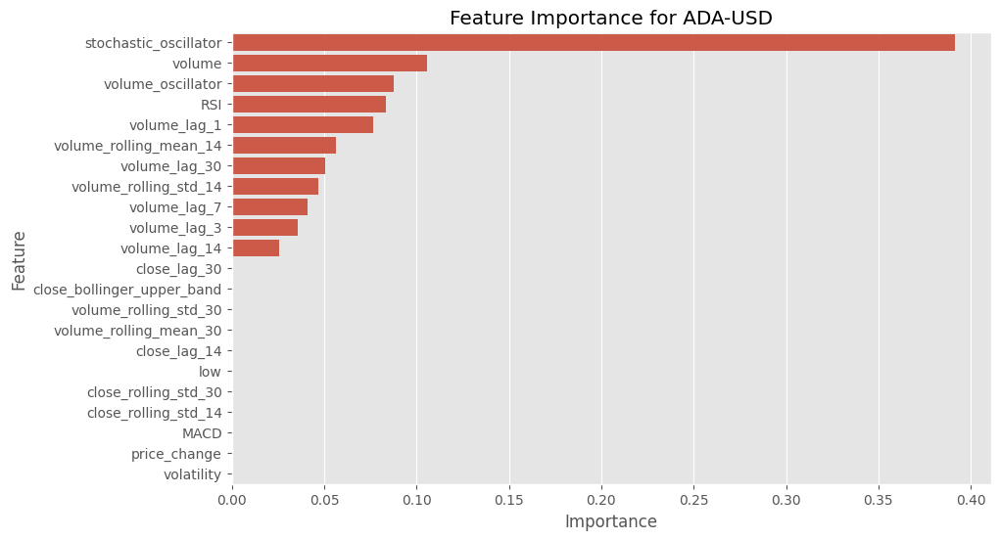

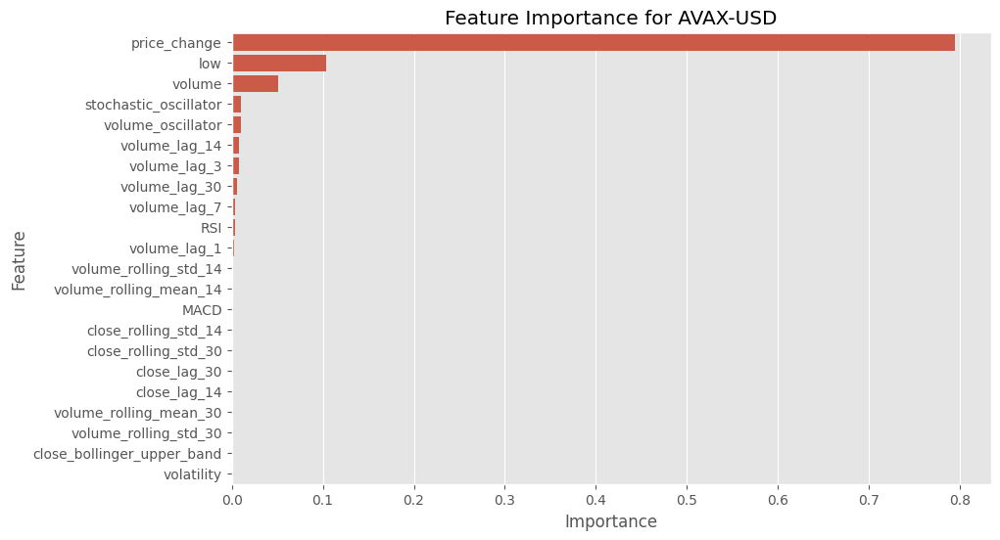

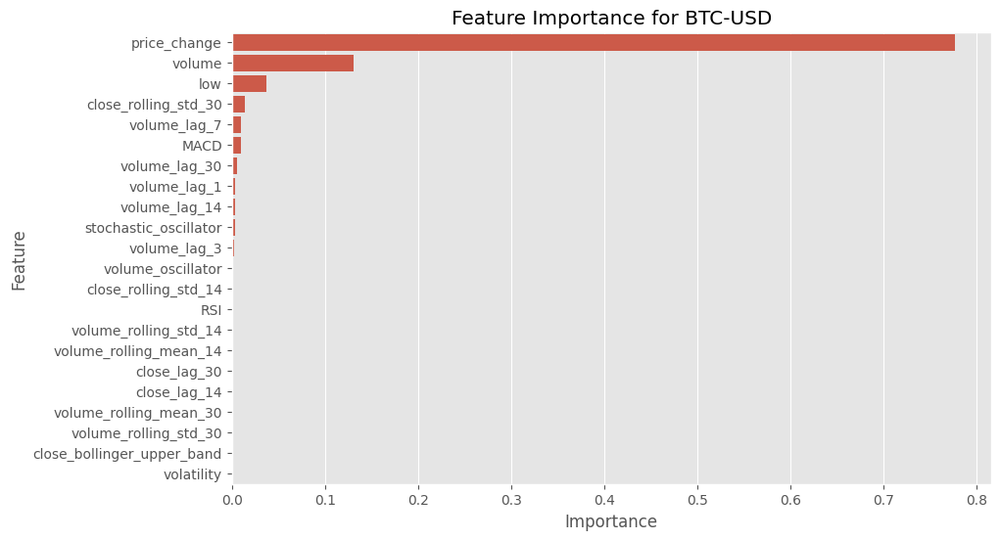

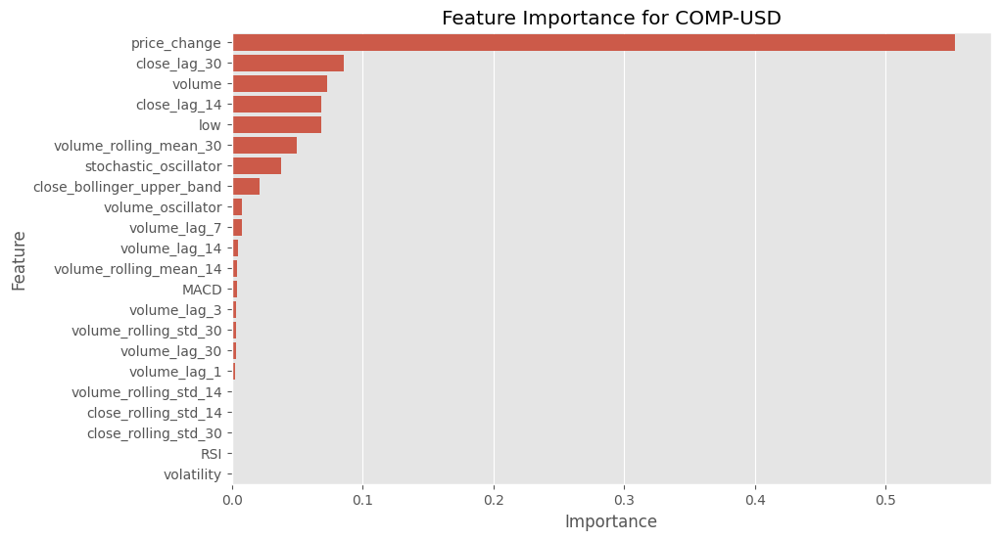

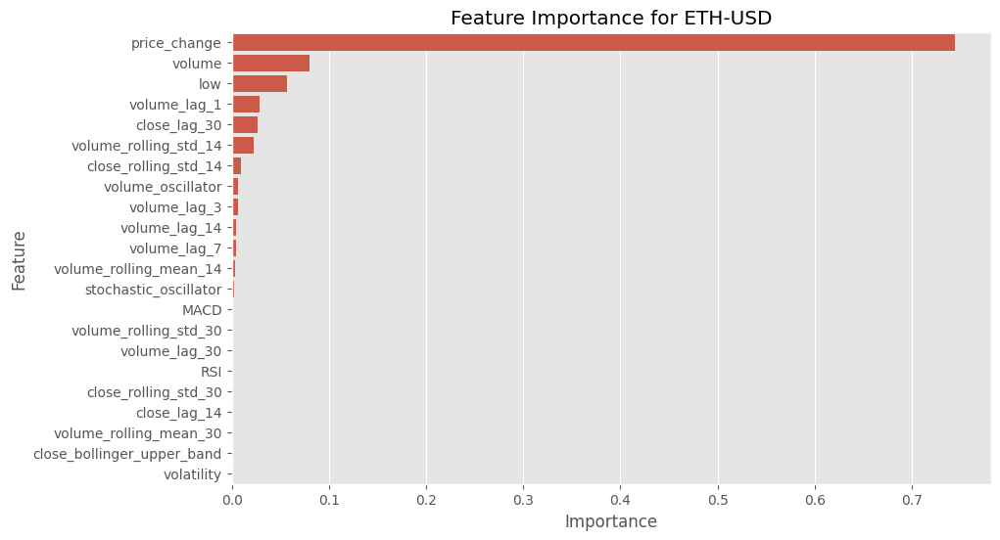

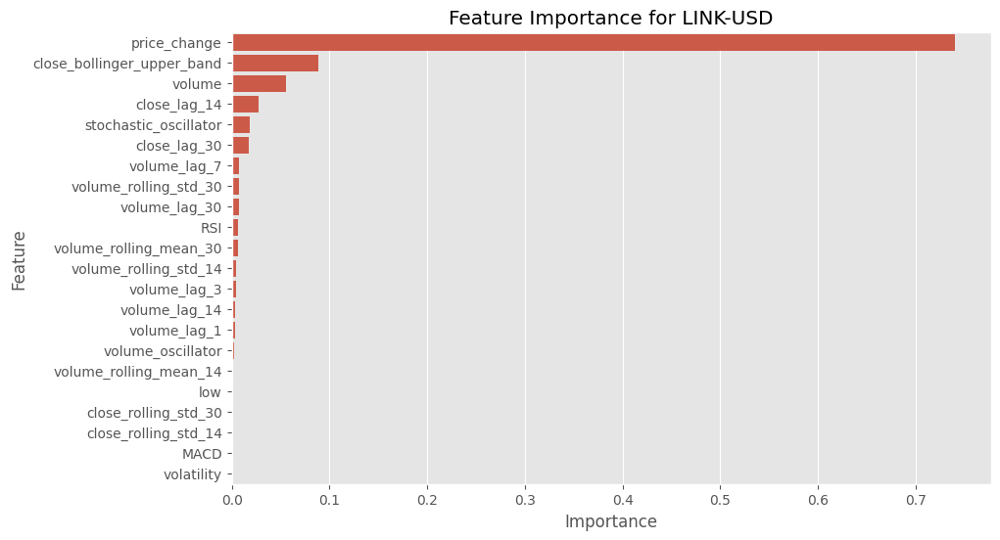

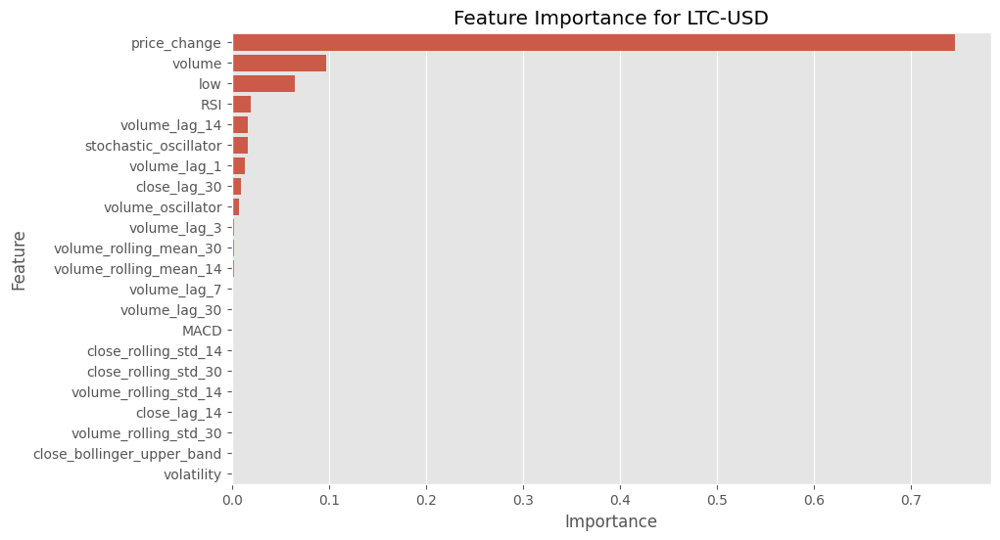

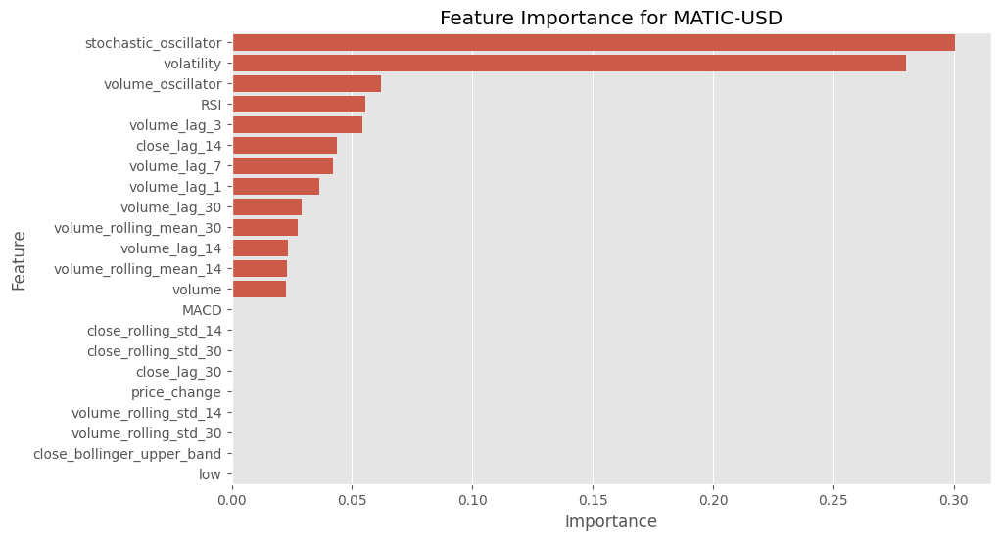

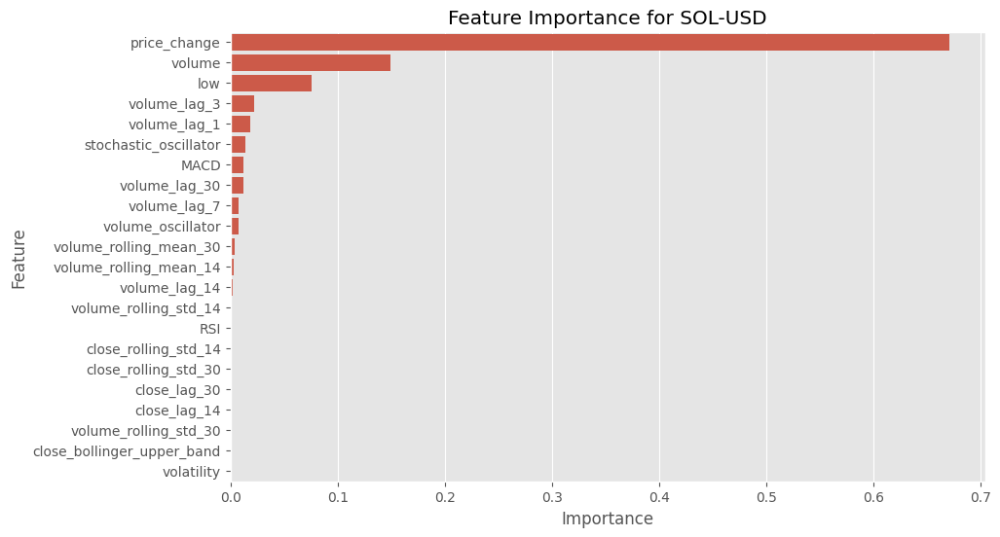

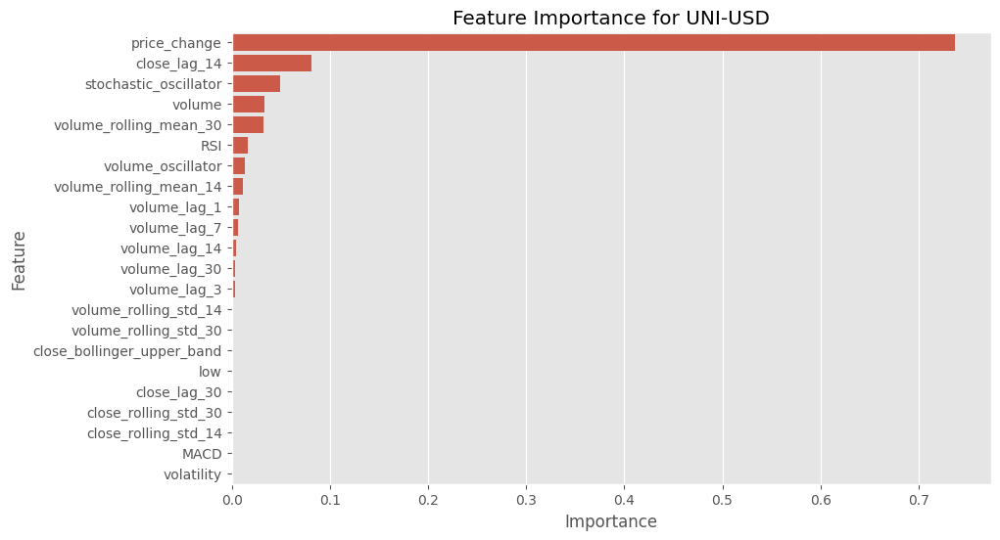

In [49]:
def plot_feature_importance(model, product_id):
    importances = model.feature_importances_
    feature_names = model.get_booster().feature_names
    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': importances
    }).sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(data=feature_importance_df, x='Importance', y='Feature')
    plt.title(f'Feature Importance for {product_id}')
    plt.show()

# Plot feature importance for each product_id
for product_id in xgboost_results.keys():
    model = xgboost_results[product_id]['model']
    plot_feature_importance(model, product_id)


##### Summary of Feature Importance Results
Here's a concise summary of the feature importance results for each product ID based on the XGBoost models:

ADA-USD

Most Important Features: stochastic_oscillator, volume, volume_rolling_mean_14, volume_oscillator
Lesser Important Features: RSI, volume_lag_1, volume_lag_3, volume_lag_7
AVAX-USD

Most Important Features: price_change, low, stochastic_oscillator
Lesser Important Features: volume, volume_lag_30, volume_lag_3
BTC-USD

Most Important Features: price_change, volume, low
Lesser Important Features: close_rolling_std_30, volume_lag_7, MACD
COMP-USD

Most Important Features: price_change, close_lag_14, close_lag_30
Lesser Important Features: volume, volume_rolling_mean_30, low
ETH-USD

Most Important Features: price_change, volume, low
Lesser Important Features: volume_rolling_std_14, close_lag_30, volume_lag_1
LINK-USD

Most Important Features: price_change, close_bollinger_upper_band, volume
Lesser Important Features: close_lag_14, close_lag_30, stochastic_oscillator
LTC-USD

Most Important Features: price_change, volume, low
Lesser Important Features: stochastic_oscillator, volume_rolling_mean_30, RSI
MATIC-USD

Most Important Features: stochastic_oscillator, volatility, volume_oscillator
Lesser Important Features: volume_lag_7, volume_lag_3, RSI
SOL-USD

Most Important Features: price_change, volume, low
Lesser Important Features: volume_lag_3, volume_lag_1, volume_lag_30
UNI-USD

Most Important Features: price_change, close_lag_14, stochastic_oscillator
Lesser Important Features: volume, volume_rolling_mean_30, volume_rolling_mean_14

##### Hyperparameter Tuning

In [50]:

def tune_xgboost_hyperparameters(train_df, target='pct_change'):
    product_ids = train_df['product_id'].unique()
    best_params = {}

    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.3],
        'subsample': [0.8, 0.9, 1.0],
        'colsample_bytree': [0.8, 0.9, 1.0]
    }

    for product_id in product_ids:
        # Filter data for the current product_id
        train_data = train_df[train_df['product_id'] == product_id]
        
        # Define the features and target
        features = [col for col in train_data.columns if col not in [target, 'product_id', 'time']]
        
        # Initialize the model
        model = xgb.XGBRegressor(objective='reg:squarederror')
        
        # Set up GridSearchCV
        grid_search = GridSearchCV(model, param_grid, scoring='neg_mean_squared_error', cv=3, n_jobs=-1, verbose=1)
        
        # Fit GridSearchCV
        grid_search.fit(train_data[features], train_data[target])
        
        # Store the best parameters
        best_params[product_id] = grid_search.best_params_
        print(f"Best parameters for {product_id}: {grid_search.best_params_}")
    
    return best_params

# Tune hyperparameters for each product_id
best_params = tune_xgboost_hyperparameters(train_df)

# Display the best parameters
for product_id, params in best_params.items():
    print(f"Best parameters for {product_id}: {params}")


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for ADA-USD: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for AVAX-USD: {'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.9}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for BTC-USD: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for COMP-USD: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for ETH-USD: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.9}
Fitting 3 folds for eac

#### XGBoost Model with the Incorporation of best features and parameters per product-id

In [51]:
# Ensure 'time' column is of datetime type and set as index
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

# Function to train and evaluate XGBoost model with important features and best hyperparameters
def train_evaluate_xgboost(df, important_features, best_params):
    results = {}
    
    for product_id in important_features.keys():
        features = important_features[product_id].tolist()
        
        # Filter the data for the current product_id
        product_df = df[df['product_id'] == product_id]
        
        # Split the data into train and test sets
        train_df = product_df[product_df.index < '2023-12-03']
        test_df = product_df[product_df.index >= '2023-12-03']
        
        # Extract features and target
        X_train = train_df[features]
        y_train = train_df['pct_change']
        X_test = test_df[features]
        y_test = test_df['pct_change']
        
        # Initialize and train the model with the best hyperparameters
        model = XGBRegressor(**best_params[product_id])
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Evaluate the model
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
        
        # Store the results
        results[product_id] = {
            'Mean Squared Error': mse,
            'Root Mean Squared Error': rmse,
            'Mean Absolute Error': mae,
            'R-Squared': r2,
            'Mean Absolute Percentage Error': mape
        }
    
    return results

# Use the previously computed important features and best parameters
important_features = feature_importance_lasso(df_reduced, target_variable='pct_change')
best_params = tune_xgboost_hyperparameters(train_df)

# Train and evaluate models
results = train_evaluate_xgboost(df, important_features, best_params)

# Display results
for product_id, metrics in results.items():
    print(f"Model Evaluation for {product_id}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print()


Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for ADA-USD: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for AVAX-USD: {'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.9}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for BTC-USD: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for COMP-USD: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}
Fitting 3 folds for each of 243 candidates, totalling 729 fits
Best parameters for ETH-USD: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.9}
Fitting 3 folds for eac

In [39]:
# Ensure 'time' column is of datetime type and set as index
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

# Function to train and evaluate XGBoost model with important features and best hyperparameters
def train_evaluate_xgboost(df, important_features, best_params):
    results = {}
    
    for product_id, features in important_features.items():
        # Filter the data for the current product_id
        product_df = df[df['product_id'] == product_id]
        
        # Split the data into train and test sets
        train_df = product_df[product_df.index < '2023-12-03']
        test_df = product_df[product_df.index >= '2023-12-03']
        
        # Extract features and target
        X_train = train_df[features]
        y_train = train_df['pct_change']
        X_test = test_df[features]
        y_test = test_df['pct_change']
        
        # Initialize and train the model with the best hyperparameters
        model = XGBRegressor(**best_params[product_id])
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Evaluate the model
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        
        # Store the results
        results[product_id] = {
            'Mean Squared Error': mse,
            'Root Mean Squared Error': rmse,
            'Mean Absolute Error': mae,
            'R-Squared': r2,
            'Mean Absolute Percentage Error': mape
        }
    
    return results

# Define important features and best hyperparameters for each product_id
important_features = {
    'ADA-USD': ['stochastic_oscillator', 'volume', 'volume_rolling_mean_14', 'volume_oscillator', 'RSI', 'volume_lag_1', 'volume_lag_3', 'volume_lag_7'],
    'AVAX-USD': ['price_change', 'low', 'stochastic_oscillator', 'volume', 'volume_lag_30', 'volume_lag_3'],
    'BTC-USD': ['price_change', 'volume', 'low', 'close_rolling_std_30', 'volume_lag_7', 'MACD'],
    'COMP-USD': ['price_change', 'close_lag_14', 'close_lag_30', 'volume', 'volume_rolling_mean_30', 'low'],
    'ETH-USD': ['price_change', 'volume', 'low', 'volume_rolling_std_14', 'close_lag_30', 'volume_lag_1'],
    'LINK-USD': ['price_change', 'close_bollinger_upper_band', 'volume', 'close_lag_14', 'close_lag_30', 'stochastic_oscillator'],
    'LTC-USD': ['price_change', 'volume', 'low', 'stochastic_oscillator', 'volume_rolling_mean_30', 'RSI'],
    'MATIC-USD': ['stochastic_oscillator', 'volatility', 'volume_oscillator', 'volume_lag_7', 'volume_lag_3', 'RSI'],
    'SOL-USD': ['price_change', 'volume', 'low', 'volume_lag_3', 'volume_lag_1', 'volume_lag_30'],
    'UNI-USD': ['price_change', 'close_lag_14', 'stochastic_oscillator', 'volume', 'volume_rolling_mean_30', 'volume_rolling_mean_14']
}

best_params = {
    'ADA-USD': {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.9},
    'AVAX-USD': {'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.9},
    'BTC-USD': {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0},
    'COMP-USD': {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0},
    'ETH-USD': {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.9},
    'LINK-USD': {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0},
    'LTC-USD': {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8},
    'MATIC-USD': {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0},
    'SOL-USD': {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8},
    'UNI-USD': {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 0.8}
}

# Train and evaluate models
results = train_evaluate_xgboost(df, important_features, best_params)

# Display results
for product_id, metrics in results.items():
    print(f"Model Evaluation for {product_id}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print()


Model Evaluation for ADA-USD:
Mean Squared Error: 0.0013800115853369157
Root Mean Squared Error: 0.03714850717507927
Mean Absolute Error: 0.027511921847971254
R-Squared: 0.24087771317999984
Mean Absolute Percentage Error: 382956732417.2524

Model Evaluation for AVAX-USD:
Mean Squared Error: 0.00022083699116648772
Root Mean Squared Error: 0.014860585155588179
Mean Absolute Error: 0.009396086996510433
R-Squared: 0.9144440748465825
Mean Absolute Percentage Error: 19974838291.133682

Model Evaluation for BTC-USD:
Mean Squared Error: 5.515036076996037e-05
Root Mean Squared Error: 0.00742632888915919
Mean Absolute Error: 0.003829163141827889
R-Squared: 0.9306260001768287
Mean Absolute Percentage Error: 0.2513209567486307

Model Evaluation for COMP-USD:
Mean Squared Error: 0.00012765322826076986
Root Mean Squared Error: 0.011298372814736193
Mean Absolute Error: 0.007668185066121435
R-Squared: 0.9289671487897473
Mean Absolute Percentage Error: 0.3108960061076436

Model Evaluation for ETH-USD:


In [53]:
# Convert the results dictionary to a DataFrame
results_df = pd.DataFrame(results).T

# Print the DataFrame in a more readable format
print(results_df.to_string())

           Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  R-Squared  Mean Absolute Percentage Error
ADA-USD              0.001391                 0.037299             0.027512   0.234922                      127.190743
AVAX-USD             0.000180                 0.013418             0.008802   0.930551                       32.901669
BTC-USD              0.000051                 0.007166             0.003996   0.935406                       31.205639
COMP-USD             0.000096                 0.009818             0.006724   0.946366                       32.109227
ETH-USD              0.000058                 0.007629             0.002728   0.944396                       32.099848
LINK-USD             0.000055                 0.007435             0.004328   0.967469                       18.321988
LTC-USD              0.000030                 0.005488             0.003250   0.978134                       52.537361
MATIC-USD            0.001080                 0.

The model performs well on most of the product IDs, with high R-Squared values, indicating a good fit.
ADA-USD and MATIC-USD have lower R-Squared values and higher Mean Absolute Percentage Errors, suggesting the model struggles more with these products.
BTC-USD, COMP-USD, LINK-USD, and LTC-USD show the best performance with high R-Squared values and low errors.
The Mean Absolute Percentage Error varies significantly across product IDs, indicating varying prediction accuracy.

#### Evaluating XGBoost model on the test set

In [55]:
# Ensure 'time' column is correctly set as index after resetting
df.reset_index(inplace=True)
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

# Function to train and evaluate XGBoost model with important features and best hyperparameters
def train_evaluate_xgboost(df, important_features, best_params):
    results = {}
    
    for product_id in df['product_id'].unique():
        features = important_features[product_id]
        params = best_params[product_id]
        
        # Filter the data for the current product_id
        product_df = df[df['product_id'] == product_id]
        
        # Split the data into train and test sets
        train_df = product_df[product_df.index < '2023-12-03']
        test_df = product_df[product_df.index >= '2023-12-03']
        
        # Extract features and target
        X_train = train_df[features]
        y_train = train_df['pct_change']
        X_test = test_df[features]
        y_test = test_df['pct_change']
        
        # Initialize and train the model with the best hyperparameters
        model = XGBRegressor(**params)
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Evaluate the model
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        
        # Store the results
        results[product_id] = {
            'Mean Squared Error': mse,
            'Root Mean Squared Error': rmse,
            'Mean Absolute Error': mae,
            'R-Squared': r2,
            'Mean Absolute Percentage Error': mape
        }
    
    return results


important_features = {product_id: features for product_id, features in important_features.items()}
best_params = {product_id: params for product_id, params in best_params.items()}

# Train and evaluate models
results = train_evaluate_xgboost(df, important_features, best_params)

# Display results in a table format
results_df = pd.DataFrame(results).T
print(results_df.to_string())


           Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  R-Squared  Mean Absolute Percentage Error
ADA-USD              0.001391                 0.037299             0.027512   0.234922                        1.271907
AVAX-USD             0.000180                 0.013418             0.008802   0.930551                        0.329017
BTC-USD              0.000051                 0.007166             0.003996   0.935406                        0.312056
COMP-USD             0.000096                 0.009818             0.006724   0.946366                        0.321092
ETH-USD              0.000058                 0.007629             0.002728   0.944396                        0.320998
LINK-USD             0.000055                 0.007435             0.004328   0.967469                        0.183220
LTC-USD              0.000030                 0.005488             0.003250   0.978134                        0.525374
MATIC-USD            0.001080                 0.

In [56]:
# Ensure 'time' column is correctly set as index after resetting
df.reset_index(inplace=True)
df['time'] = pd.to_datetime(df['time'])
df.set_index('time', inplace=True)

# Function to train and evaluate XGBoost model with important features and best hyperparameters
def train_evaluate_xgboost(df, important_features, best_params):
    results = {}
    
    for product_id in df['product_id'].unique():
        features = important_features[product_id]
        params = best_params[product_id]
        
        # Filter the data for the current product_id
        product_df = df[df['product_id'] == product_id]
        
        # Split the data into train and test sets
        train_df = product_df[product_df.index < '2023-12-03']
        test_df = product_df[product_df.index >= '2023-12-03']
        
        # Extract features and target
        X_train = train_df[features]
        y_train = train_df['pct_change']
        X_test = test_df[features]
        y_test = test_df['pct_change']
        
        # Initialize and train the model with the best hyperparameters
        model = XGBRegressor(**params)
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Evaluate the model
        mse = mean_squared_error(y_test, y_pred)
        rmse = mean_squared_error(y_test, y_pred, squared=False)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        
        # Store the results
        results[product_id] = {
            'Mean Squared Error': mse,
            'Root Mean Squared Error': rmse,
            'Mean Absolute Error': mae,
            'R-Squared': r2,
            'Mean Absolute Percentage Error': mape
        }
    
    return results

# Retrieve the important features and best hyperparameters for each product_id from previous runs
# Assume `important_features` and `best_params` have already been obtained from previous runs
important_features = {product_id: features for product_id, features in important_features.items()}
best_params = {product_id: params for product_id, params in best_params.items()}

# Train and evaluate models
results = train_evaluate_xgboost(df, important_features, best_params)

# Display results in a table format
results_df = pd.DataFrame(results).T
print(results_df.to_string())


           Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  R-Squared  Mean Absolute Percentage Error
ADA-USD              0.001391                 0.037299             0.027512   0.234922                        1.271907
AVAX-USD             0.000180                 0.013418             0.008802   0.930551                        0.329017
BTC-USD              0.000051                 0.007166             0.003996   0.935406                        0.312056
COMP-USD             0.000096                 0.009818             0.006724   0.946366                        0.321092
ETH-USD              0.000058                 0.007629             0.002728   0.944396                        0.320998
LINK-USD             0.000055                 0.007435             0.004328   0.967469                        0.183220
LTC-USD              0.000030                 0.005488             0.003250   0.978134                        0.525374
MATIC-USD            0.001080                 0.